In [1]:
%matplotlib inline
from matplotlib import pyplot as plt
from numpy import *
plt.rc('text', usetex=True)
plt.rc('font', size=16)
import re
import scipy.special as sc
import numpyro as nr
import jax
import jax.numpy as jnp
import jax.scipy.special as jsc
from datetime import datetime
EPS = jnp.finfo(jnp.float32).eps #finfo(float64).eps
EMAX = jnp.finfo(jnp.float32).max #finfo(float64).max

In [2]:
import dynesty as dn

# Defining the likelihoods, first

In [3]:
work_dir = '/Users/sammcd00/Dropbox/1recently-completed-papers/46wavelets4_cmsz/wavelets4_and_GCE_templates/YZ_template_fit_2021/fit_2021/'
template_dir = '/Users/sammcd00/Dropbox/1recently-completed-papers/46wavelets4_cmsz/wavelets4_and_GCE_templates/YZ_template_fit_2021/20x20_template_Macias/'

In [4]:
# import Fermi data and 19 templates
# 'HI_ring1','HI_ring2','HI_ring3','HI_ring4','H2_ring1','H2_ring2','H2_ring3','H2_ring4',
# 'posres', 'negres'
# 'ics_ring1A', 'ics_ring1B', 'ics_ring1C', 'ics_ring2', 'ics_ring3', 'ics_ring4'
fermi_front_20x20 = load(template_dir + 'fermi_w009_to_w670_front_only_14_Ebin_20x20window_normal.npy').reshape(14, -1)
smooth_HI_ring1_20x20 = load(template_dir + 'HI_ring1_front_only_14_Ebin_20x20window_normal.npy').reshape(14, -1)
smooth_HI_ring2_20x20 = load(template_dir + 'HI_ring2_front_only_14_Ebin_20x20window_normal.npy').reshape(14, -1)
smooth_HI_ring3_20x20 = load(template_dir + 'HI_ring3_front_only_14_Ebin_20x20window_normal.npy').reshape(14, -1)
smooth_HI_ring4_20x20 = load(template_dir + 'HI_ring4_front_only_14_Ebin_20x20window_normal.npy').reshape(14, -1)
smooth_H2_ring1_20x20 = load(template_dir + 'H2_ring1_front_only_14_Ebin_20x20window_normal.npy').reshape(14, -1)
smooth_H2_ring2_20x20 = load(template_dir + 'H2_ring2_front_only_14_Ebin_20x20window_normal.npy').reshape(14, -1)
smooth_H2_ring3_20x20 = load(template_dir + 'H2_ring3_front_only_14_Ebin_20x20window_normal.npy').reshape(14, -1)
smooth_H2_ring4_20x20 = load(template_dir + 'H2_ring4_front_only_14_Ebin_20x20window_normal.npy').reshape(14, -1)
smooth_posres_20x20 = load(template_dir + 'posres_front_only_14_Ebin_20x20window_normal.npy').reshape(14, -1)
smooth_negres_20x20 = load(template_dir + 'negres_front_only_14_Ebin_20x20window_normal.npy').reshape(14, -1)
smooth_ics_ring1A_20x20 = load(template_dir + 'ics_ring1A_front_only_14_Ebin_20x20window_normal.npy').reshape(14, -1)
smooth_ics_ring1B_20x20 = load(template_dir + 'ics_ring1B_front_only_14_Ebin_20x20window_normal.npy').reshape(14, -1)
smooth_ics_ring1C_20x20 = load(template_dir + 'ics_ring1C_front_only_14_Ebin_20x20window_normal.npy').reshape(14, -1)
smooth_ics_ring2_20x20 = load(template_dir + 'ics_ring2_front_only_14_Ebin_20x20window_normal.npy').reshape(14, -1)
smooth_ics_ring3_20x20 = load(template_dir + 'ics_ring3_front_only_14_Ebin_20x20window_normal.npy').reshape(14, -1)
smooth_ics_ring4_20x20 = load(template_dir + 'ics_ring4_front_only_14_Ebin_20x20window_normal.npy').reshape(14, -1)
smooth_bubble_20x20 = load(template_dir + 'bubble_front_only_14_Ebin_20x20window_normal.npy').reshape(14, -1)
smooth_isotropic_20x20 = load(template_dir + 'isotropic_front_only_14_Ebin_20x20window_normal.npy').reshape(14, -1)

dm_name = 'dm_1'
smooth_dm_20x20 = load(template_dir + dm_name + '_front_only_14_Ebin_20x20window_normal.npy').reshape(14, -1)
bb_name = 'dm_14'
smooth_bb_20x20 = load(template_dir + bb_name + '_front_only_14_Ebin_20x20window_normal.npy').reshape(14, -1)
x_name = 'dm_15'
smooth_x_20x20 = load(template_dir + x_name + '_front_only_14_Ebin_20x20window_normal.npy').reshape(14, -1)
sb_name = 'dm_64'
smooth_sb_20x20 = load(template_dir + sb_name + '_front_only_14_Ebin_20x20window_normal.npy').reshape(14, -1)

# load mask
mask_name = '4FGLDR2'
#mask_name = '4FGLDR2S3'
mask_20x20 = load(work_dir + 'mask_4FGL-DR2_14_Ebin_20x20window_normal.npy').reshape(14, -1)
#mask_20x20 = load(work_dir + 'mask_4FGL-DR2_S3_14_Ebin_20x20window_normal.npy')
# load penality factor
isotropic_error = loadtxt(work_dir +'FracErrorIso_14_Ebin.dat')[:,1]
bubble_error = loadtxt(work_dir +'FracErrorFB_14_Ebin.dat')[:,1]

In [5]:
yzbestdict = load("/Users/sammcd00/Dropbox/gce2022_loc/gce2022/YZ_template_fit_2022/fit_Macias_summary/2022-05-13_model_Macias_dm_1_mask_4FGLDR2.npy", allow_pickle=True)

In [6]:
yzbestvals = zeros((14,19))
yzbestvals20 = zeros((14,20))
for i, a in enumerate(yzbestdict):
    for j, v in enumerate(a.values()):
        yzbestvals[i,j] = v[1]
        if j<19:
            yzbestvals20[i,j] = v[1]
        else:
            yzbestvals20[i,j] = 0

In [7]:
def jtemplatesA_masked(bin_no):
    return jnp.einsum('i,ji->ji', jnp.asarray(mask_20x20)[bin_no], jnp.array([smooth_HI_ring1_20x20[bin_no],
                    smooth_HI_ring2_20x20[bin_no], smooth_HI_ring3_20x20[bin_no], smooth_HI_ring4_20x20[bin_no],
                 smooth_H2_ring1_20x20[bin_no], smooth_H2_ring2_20x20[bin_no], smooth_H2_ring3_20x20[bin_no],
                    smooth_H2_ring4_20x20[bin_no], smooth_posres_20x20[bin_no],smooth_negres_20x20[bin_no],
                 smooth_ics_ring1A_20x20[bin_no], smooth_ics_ring1B_20x20[bin_no], smooth_ics_ring1C_20x20[bin_no],
                 smooth_ics_ring2_20x20[bin_no], smooth_ics_ring3_20x20[bin_no], smooth_ics_ring4_20x20[bin_no],
                 smooth_bubble_20x20[bin_no], smooth_isotropic_20x20[bin_no]]))
def jtemplatesDM_masked(bin_no):
    return jnp.einsum('i,ji->ji', jnp.asarray(mask_20x20)[bin_no], jnp.array([smooth_HI_ring1_20x20[bin_no],
                    smooth_HI_ring2_20x20[bin_no], smooth_HI_ring3_20x20[bin_no], smooth_HI_ring4_20x20[bin_no],
                 smooth_H2_ring1_20x20[bin_no], smooth_H2_ring2_20x20[bin_no], smooth_H2_ring3_20x20[bin_no],
                    smooth_H2_ring4_20x20[bin_no], smooth_posres_20x20[bin_no],smooth_negres_20x20[bin_no],
                 smooth_ics_ring1A_20x20[bin_no], smooth_ics_ring1B_20x20[bin_no], smooth_ics_ring1C_20x20[bin_no],
                 smooth_ics_ring2_20x20[bin_no], smooth_ics_ring3_20x20[bin_no], smooth_ics_ring4_20x20[bin_no],
                 smooth_bubble_20x20[bin_no], smooth_isotropic_20x20[bin_no], smooth_dm_20x20[bin_no]]))
def jtemplatesBB_masked(bin_no):
    return jnp.einsum('i,ji->ji', jnp.asarray(mask_20x20)[bin_no], jnp.array([smooth_HI_ring1_20x20[bin_no],
                    smooth_HI_ring2_20x20[bin_no], smooth_HI_ring3_20x20[bin_no], smooth_HI_ring4_20x20[bin_no],
                 smooth_H2_ring1_20x20[bin_no], smooth_H2_ring2_20x20[bin_no], smooth_H2_ring3_20x20[bin_no],
                    smooth_H2_ring4_20x20[bin_no], smooth_posres_20x20[bin_no],smooth_negres_20x20[bin_no],
                 smooth_ics_ring1A_20x20[bin_no], smooth_ics_ring1B_20x20[bin_no], smooth_ics_ring1C_20x20[bin_no],
                 smooth_ics_ring2_20x20[bin_no], smooth_ics_ring3_20x20[bin_no], smooth_ics_ring4_20x20[bin_no],
                 smooth_bubble_20x20[bin_no], smooth_isotropic_20x20[bin_no], smooth_bb_20x20[bin_no]]))
def jtemplatesX_masked(bin_no):
    return jnp.einsum('i,ji->ji', jnp.asarray(mask_20x20)[bin_no], jnp.array([smooth_HI_ring1_20x20[bin_no],
                    smooth_HI_ring2_20x20[bin_no], smooth_HI_ring3_20x20[bin_no], smooth_HI_ring4_20x20[bin_no],
                 smooth_H2_ring1_20x20[bin_no], smooth_H2_ring2_20x20[bin_no], smooth_H2_ring3_20x20[bin_no],
                    smooth_H2_ring4_20x20[bin_no], smooth_posres_20x20[bin_no],smooth_negres_20x20[bin_no],
                 smooth_ics_ring1A_20x20[bin_no], smooth_ics_ring1B_20x20[bin_no], smooth_ics_ring1C_20x20[bin_no],
                 smooth_ics_ring2_20x20[bin_no], smooth_ics_ring3_20x20[bin_no], smooth_ics_ring4_20x20[bin_no],
                 smooth_bubble_20x20[bin_no], smooth_isotropic_20x20[bin_no], smooth_x_20x20[bin_no]]))
def jtemplatesSB_masked(bin_no):
    return jnp.einsum('i,ji->ji', jnp.asarray(mask_20x20)[bin_no], jnp.array([smooth_HI_ring1_20x20[bin_no],
                    smooth_HI_ring2_20x20[bin_no], smooth_HI_ring3_20x20[bin_no], smooth_HI_ring4_20x20[bin_no],
                 smooth_H2_ring1_20x20[bin_no], smooth_H2_ring2_20x20[bin_no], smooth_H2_ring3_20x20[bin_no],
                    smooth_H2_ring4_20x20[bin_no], smooth_posres_20x20[bin_no],smooth_negres_20x20[bin_no],
                 smooth_ics_ring1A_20x20[bin_no], smooth_ics_ring1B_20x20[bin_no], smooth_ics_ring1C_20x20[bin_no],
                 smooth_ics_ring2_20x20[bin_no], smooth_ics_ring3_20x20[bin_no], smooth_ics_ring4_20x20[bin_no],
                 smooth_bubble_20x20[bin_no], smooth_isotropic_20x20[bin_no], smooth_sb_20x20[bin_no]]))
def jtemplatesBX_masked(bin_no):
    return jnp.einsum('i,ji->ji', jnp.asarray(mask_20x20)[bin_no], jnp.array([smooth_HI_ring1_20x20[bin_no],
                    smooth_HI_ring2_20x20[bin_no], smooth_HI_ring3_20x20[bin_no], smooth_HI_ring4_20x20[bin_no],
                 smooth_H2_ring1_20x20[bin_no], smooth_H2_ring2_20x20[bin_no], smooth_H2_ring3_20x20[bin_no],
                    smooth_H2_ring4_20x20[bin_no], smooth_posres_20x20[bin_no],smooth_negres_20x20[bin_no],
                 smooth_ics_ring1A_20x20[bin_no], smooth_ics_ring1B_20x20[bin_no], smooth_ics_ring1C_20x20[bin_no],
                 smooth_ics_ring2_20x20[bin_no], smooth_ics_ring3_20x20[bin_no], smooth_ics_ring4_20x20[bin_no],
                 smooth_bubble_20x20[bin_no], smooth_isotropic_20x20[bin_no], smooth_bb_20x20[bin_no], smooth_x_20x20[bin_no]]))

In [8]:
def jmodel_masked(theta, bin_no, ex_num):
    if ex_num==0:
        return jnp.einsum('i,ij->j', 10**theta, jtemplatesA_masked(bin_no))#no excess
    if ex_num==1:
        return jnp.einsum('i,ij->j', 10**theta, jtemplatesDM_masked(bin_no))#DM
    if ex_num==2:
        return jnp.einsum('i,ij->j', 10**theta, jtemplatesBB_masked(bin_no))#boxy bulge
    if ex_num==3:
        return jnp.einsum('i,ij->j', 10**theta, jtemplatesX_masked(bin_no))#x-shaped bulge
    if ex_num==4:
        return jnp.einsum('i,ij->j', 10**theta, jtemplatesSB_masked(bin_no))#complete stellar bulge; dm_64
    if ex_num==5:
        return jnp.einsum('i,ij->j', 10**theta, jtemplatesBX_masked(bin_no))#boxy and x-shaped independent

In [9]:
def jdata_masked(bin_no):
    return jnp.asarray(fermi_front_20x20)[bin_no]*jnp.asarray(mask_20x20)[bin_no]

In [10]:
jjtemplatesA_masked = jax.jit(jtemplatesA_masked, static_argnums=(0,))
jjtemplatesDM_masked = jax.jit(jtemplatesDM_masked, static_argnums=(0,))
jjtemplatesBB_masked = jax.jit(jtemplatesBB_masked, static_argnums=(0,))
jjtemplatesX_masked = jax.jit(jtemplatesX_masked, static_argnums=(0,))
jjtemplatesSB_masked = jax.jit(jtemplatesSB_masked, static_argnums=(0,))
jjtemplatesBX_masked = jax.jit(jtemplatesBX_masked, static_argnums=(0,))

In [11]:
jjmodel_masked = jax.jit(jmodel_masked, static_argnums=(1,2))

In [12]:
jjdata_masked = jax.jit(jdata_masked, static_argnums=(0,))

In [13]:
def jlnlike(theta, bin_no=0, ex_num=1):
    
    bubble_norm, isotropic_norm = 10**theta[16], 10**theta[17]
    
    e, d = jjmodel_masked(theta, bin_no, ex_num), jjdata_masked(bin_no)
    mylike = 2*(jnp.sum(e+jsc.gammaln(d+1) - d*jnp.log(e+EPS)))
    # additional constraints on bubble and isotropic norms
    chi2extBub = ((bubble_norm-1.0)/bubble_error[bin_no])**2
    chi2extIso = ((isotropic_norm-1.0)/isotropic_error[bin_no])**2
    
    return -.5*(mylike + chi2extBub + chi2extIso)
jjlnlike = jax.jit(jlnlike, static_argnums=(1,2))

pmin = jnp.asarray([-2.,-2.,-2.,-2.,-2.,-2.,-2.,-2.,-2.,-2.,-2.,-2.,-2.,-2.,-2.,-2.,-2.,-2.,-2.,-2.])
pmax = jnp.asarray([10.,10.,10.,10.,10.,10.,10.,10.,6.,4.,10.,10.,10.,10.,10.,10.,1.,1.,1.,1.])
bounds = jnp.c_[pmin, pmax]


def jlnprior(theta):
    return -(1-prod(theta>pmin[:len(theta)])*prod(theta<pmax[:len(theta)]))*EMAX
jjlnprior = jax.jit(jlnprior)

def jlnprob(theta, bin_no=0, ex_num=1):
    lp = jjlnprior(theta)
    return lp + jjlnlike(theta, bin_no, ex_num)
jjlnprob = jax.jit(jlnprob, static_argnums=(1,2))

In [14]:
nodm_samp_dict = {}
nodm_samp_dict['name'] = 'no excess'
nodm_samp_dict['ex_num'] = 0
nodm_samp_dict['dim'] = 18
nodm_samp_dict['dn_sampler']={}
nodm_samp_dict['nr_sampler']={}
dm_samp_dict = {}
dm_samp_dict['name'] = 'dm'
dm_samp_dict['ex_num'] = 1
dm_samp_dict['dim'] = 19
dm_samp_dict['dn_sampler']={}
dm_samp_dict['dn_sampler']={}
bb_samp_dict = {}
bb_samp_dict['name'] = 'bb'
bb_samp_dict['ex_num'] = 2
bb_samp_dict['dim'] = 19
bb_samp_dict['dn_sampler']={}
bb_samp_dict['dn_sampler']={}
x_samp_dict = {}
x_samp_dict['name'] = 'x'
x_samp_dict['ex_num'] = 3
x_samp_dict['dim'] = 19
x_samp_dict['dn_sampler']={}
x_samp_dict['dn_sampler']={}
sb_samp_dict = {}
sb_samp_dict['name'] = 'sb'
sb_samp_dict['ex_num'] = 4
sb_samp_dict['dim'] = 19
sb_samp_dict['dn_sampler']={}
sb_samp_dict['dn_sampler']={}
bx_samp_dict = {}
bx_samp_dict['name'] = 'bx'
bx_samp_dict['ex_num'] = 5
bx_samp_dict['dim'] = 20
bx_samp_dict['dn_sampler']={}
bx_samp_dict['dn_sampler']={}

# dynesty stuff first

In [15]:
def ptform(x, dim):
    return x*(pmax[:dim]-pmin[:dim])+pmin[:dim]

In [16]:
for d in [nodm_samp_dict, dm_samp_dict, bb_samp_dict, x_samp_dict, sb_samp_dict, bx_samp_dict]:
    for i in range(14):
        d['dn_sampler'][i] = dn.NestedSampler(lambda x: jjlnlike(x, i, ex_num=d['ex_num']),
                                              lambda x: ptform(x, d['dim']), d['dim'])

In [23]:
dm_samp_dict['dn_sampler'][0].run_nested(dlogz=100)

23548it [38:47, 10.12it/s, +500 | bound: 302 | nc: 1 | ncall: 869768 | eff(%):  2.766 | loglstar:   -inf < -92952.492 <    inf | logz: -92999.017 +/-    nan | dlogz:  0.001 >  0.509]


In [26]:
jjlnprob(dm_samp_dict['dn_sampler'][0].results.samples[-1])

DeviceArray(-92952.49, dtype=float32)

In [71]:
save("/Users/sammcd00/Desktop/trialdndict", {'samples':dm_samp_dict['dn_sampler'][0].results.samples,
                                            'weights':dm_samp_dict['dn_sampler'][0].results.logl}, allow_pickle=True)

In [76]:
load("/Users/sammcd00/Desktop/trialdndict.npy", allow_pickle=True).item()['weights'].shape

(24048,)

In [94]:
max(dm_samp_dict['dn_sampler'][0].results.logl) - dm_samp_dict['dn_sampler'][0].results.logl[-1]

0.0

In [77]:
from datetime import datetime

In [90]:
datetime.now().strftime("%d%b")

'16Aug'

In [67]:
for d in [nodm_samp_dict, dm_samp_dict, bb_samp_dict, x_samp_dict, sb_samp_dict, bx_samp_dict]:
    print(d['name'])
    for i in range(14):
        print(i)
        d['dn_sampler'][i].run_nested(dlogz=3)

no excess
0


23192it [35:59, 10.74it/s, +500 | bound: 296 | nc: 1 | ncall: 830084 | eff(%):  2.856 | loglstar:   -inf < -92954.828 <    inf | logz: -93003.217 +/-    nan | dlogz:  0.015 >  3.000]


1


31319it [51:06,  9.69it/s, bound: 410 | nc: 38 | ncall: 1140033 | eff(%):  2.747 | loglstar:   -inf < -118241.688 <    inf | logz: -118305.315 +/-  0.469 | dlogz: 20.161 >  3.000]Traceback (most recent call last):
  File "/Users/sammcd00/mambaforge/envs/py3/lib/python3.10/site-packages/dynesty/dynesty.py", line 1029, in __call__
    return self.func(np.asarray(x).copy(), *self.args, **self.kwargs)
  File "/var/folders/07/qk1th73j5_q_7520qxjw8j7c0000gp/T/ipykernel_46523/1423775381.py", line 4, in <lambda>
    lambda x: ptform(x, d['dim']), d['dim'])
  File "/var/folders/07/qk1th73j5_q_7520qxjw8j7c0000gp/T/ipykernel_46523/4114019469.py", line 2, in ptform
    return x*(pmax[:dim]-pmin[:dim])+pmin[:dim]
  File "/Users/sammcd00/mambaforge/envs/py3/lib/python3.10/site-packages/jax/_src/numpy/lax_numpy.py", line 3606, in _rewriting_take
    return _gather(arr, treedef, static_idx, dynamic_idx, indices_are_sorted,
  File "/Users/sammcd00/mambaforge/envs/py3/lib/python3.10/site-packages/jax/_s

Exception while calling prior_transform function:
  params: [0.20425525 0.5693148  0.033668   0.55284023 0.55187247 0.51398677
 0.56575535 0.26109928 0.90645175 0.89314714 0.49061377 0.0604067
 0.0267484  0.51796371 0.39711927 0.62856118 0.75313908 0.81530754]
  args: []
  kwargs: {}
  exception:


KeyboardInterrupt: 

dlogz\~1e4 takes \~250s; dlogz\~1e3 takes \~540s; dlogz\~100 takes \~1135s; dlogz\~10 takes \~1800s

In [71]:
d['dn_sampler'][0].results.samples[-1]

array([ 0.3860922 ,  4.1837854 ,  4.5464535 ,  1.8827119 ,  4.3811154 ,
        3.835545  ,  4.4799495 , -0.59333944,  4.9282904 ,  4.39611   ,
        0.78237987,  3.6578116 ,  2.0204792 , -1.9236764 ,  5.4958715 ,
       -0.7026739 ,  0.28376484, -0.5431347 ], dtype=float32)

### galprop-based results

In [17]:
Gwork_dir = '/Users/sammcd00/Dropbox/1recently-completed-papers/46wavelets4_cmsz/wavelets4_and_GCE_templates/YZ_template_fit_2021/20x20_template_October/'

In [18]:
bremss = load(Gwork_dir+"bremss_model_8t_front_only_14_Ebin_20x20window_normal.npy").reshape(14, -1)
pi0 = load(Gwork_dir+"pion0_model_8t_front_only_14_Ebin_20x20window_normal.npy").reshape(14, -1)
ics = load(Gwork_dir+"ics_model_8t_front_only_14_Ebin_20x20window_normal.npy").reshape(14, -1)

In [32]:
bremss_nodm = load(Gwork_dir+"bremss_model_7p_front_only_14_Ebin_20x20window_normal.npy").reshape(14, -1)
pi0_nodm = load(Gwork_dir+"pion0_model_7p_front_only_14_Ebin_20x20window_normal.npy").reshape(14, -1)
ics_nodm = load(Gwork_dir+"ics_model_7p_front_only_14_Ebin_20x20window_normal.npy").reshape(14, -1)

In [19]:
def jmodelG_masked(theta, bin_no):
    return jnp.einsum('j,i,ji->i', 10**theta, jnp.asarray(mask_20x20)[bin_no],
                      jnp.array([bremss[bin_no] + pi0[bin_no], ics[bin_no], smooth_bubble_20x20[bin_no],
                                 smooth_isotropic_20x20[bin_no], smooth_dm_20x20[bin_no]]))
jjmodelG_masked = jax.jit(jmodelG_masked, static_argnums=(1,))

In [60]:
def jmodelG_masked_bb(theta, bin_no):
    return jnp.einsum('j,i,ji->i', 10**theta, jnp.asarray(mask_20x20)[bin_no],
                      jnp.array([bremss[bin_no] + pi0[bin_no], ics[bin_no], smooth_bubble_20x20[bin_no],
                                 smooth_isotropic_20x20[bin_no], smooth_bb_20x20[bin_no]]))
jjmodelG_masked_bb = jax.jit(jmodelG_masked_bb, static_argnums=(1,))

In [36]:
def jmodelG_masked_nodm(theta, bin_no):
    return jnp.einsum('j,i,ji->i', 10**theta, jnp.asarray(mask_20x20)[bin_no],
                      jnp.array([bremss_nodm[bin_no] + pi0_nodm[bin_no], ics_nodm[bin_no],
                                 smooth_bubble_20x20[bin_no], smooth_isotropic_20x20[bin_no]]))
jjmodelG_masked_nodm = jax.jit(jmodelG_masked_nodm, static_argnums=(1,))

In [37]:
def jlnlikeG(theta, bin_no=0):
    
    bubble_norm, isotropic_norm = 10**theta[2], 10**theta[3]
    
    e, d = jjmodelG_masked(theta, bin_no), jjdata_masked(bin_no)
    mylike = 2*(jnp.sum(e+jsc.gammaln(d+1) - d*jnp.log(e+EPS)))
    # additional constraints on bubble and isotropic norms
    chi2extBub = ((bubble_norm-1.0)/bubble_error[bin_no])**2
    chi2extIso = ((isotropic_norm-1.0)/isotropic_error[bin_no])**2
    
    return -.5*(mylike + chi2extBub + chi2extIso)
jjlnlikeG = jax.jit(jlnlikeG, static_argnums=(1,))

pminG = jnp.asarray([-4.,-4.,-4.,-4.,-4.])
pmaxG = jnp.asarray([2.,2.,2.,2.,2.])
bounds = jnp.c_[pmin, pmax]


def jlnpriorG(theta):
    return -(1-prod(theta>pminG[:len(theta)])*prod(theta<pmaxG[:len(theta)]))*EMAX
jjlnpriorG = jax.jit(jlnpriorG)

def jlnprobG(theta, bin_no=0):
    lp = jjlnpriorG(theta)
    return lp + jjlnlikeG(theta, bin_no)
jjlnprobG = jax.jit(jlnprobG, static_argnums=(1,))

In [38]:
def jlnlikeG_nodm(theta, bin_no=0):
    
    bubble_norm, isotropic_norm = 10**theta[2], 10**theta[3]
    
    e, d = jjmodelG_masked_nodm(theta, bin_no), jjdata_masked(bin_no)
    mylike = 2*(jnp.sum(e+jsc.gammaln(d+1) - d*jnp.log(e+EPS)))
    # additional constraints on bubble and isotropic norms
    chi2extBub = ((bubble_norm-1.0)/bubble_error[bin_no])**2
    chi2extIso = ((isotropic_norm-1.0)/isotropic_error[bin_no])**2
    
    return -.5*(mylike + chi2extBub + chi2extIso)
jjlnlikeG_nodm = jax.jit(jlnlikeG_nodm, static_argnums=(1,))

pminG = jnp.asarray([-4.,-4.,-4.,-4.,-4.])
pmaxG = jnp.asarray([2.,2.,2.,2.,2.])
bounds = jnp.c_[pmin, pmax]


def jlnpriorG_nodm(theta):
    return -(1-prod(theta>pminG[:len(theta)])*prod(theta<pmaxG[:len(theta)]))*EMAX
jjlnpriorG_nodm = jax.jit(jlnpriorG_nodm)

def jlnprobG_nodm(theta, bin_no=0):
    lp = jjlnpriorG_nodm(theta)
    return lp + jjlnlikeG_nodm(theta, bin_no)
jjlnprobG_nodm = jax.jit(jlnprobG_nodm, static_argnums=(1,))

In [61]:
def jlnlikeG_bb(theta, bin_no=0):
    
    bubble_norm, isotropic_norm = 10**theta[2], 10**theta[3]
    
    e, d = jjmodelG_masked_bb(theta, bin_no), jjdata_masked(bin_no)
    mylike = 2*(jnp.sum(e+jsc.gammaln(d+1) - d*jnp.log(e+EPS)))
    # additional constraints on bubble and isotropic norms
    chi2extBub = ((bubble_norm-1.0)/bubble_error[bin_no])**2
    chi2extIso = ((isotropic_norm-1.0)/isotropic_error[bin_no])**2
    
    return -.5*(mylike + chi2extBub + chi2extIso)
jjlnlikeG_bb = jax.jit(jlnlikeG_bb, static_argnums=(1,))

pminG = jnp.asarray([-4.,-4.,-4.,-4.,-4.])
pmaxG = jnp.asarray([2.,2.,2.,2.,2.])
bounds = jnp.c_[pmin, pmax]


def jlnpriorG_bb(theta):
    return -(1-prod(theta>pminG[:len(theta)])*prod(theta<pmaxG[:len(theta)]))*EMAX
jjlnpriorG_bb = jax.jit(jlnpriorG_bb)

def jlnprobG_bb(theta, bin_no=0):
    lp = jjlnpriorG_bb(theta)
    return lp + jjlnlikeG_bb(theta, bin_no)
jjlnprobG_bb = jax.jit(jlnprobG_bb, static_argnums=(1,))

In [66]:
def ptformG(x, dim):
    return x*(pmaxG[:dim]-pminG[:dim])+pminG[:dim]
jptformG = jax.jit(ptformG, static_argnums=(1,))

In [220]:
Gsampler={}
for i in range(14):
    Gsampler[i] = dn.NestedSampler(lambda x: jjlnlikeG(x, i),  lambda x: ptformG(x, 5), 5)

In [39]:
Gsampler_nodm={}
for i in range(14):
    Gsampler_nodm[i] = dn.NestedSampler(lambda x: jjlnlikeG_nodm(x, i),  lambda x: ptformG(x, 4), 4)

In [67]:
Gsampler_bb={}
Gsampler_bb['dn']={}
for i in range(14):
    Gsampler_bb['dn'][i] = dn.NestedSampler(lambda x: jjlnlikeG_bb(x, i),  lambda x: ptformG(x, 5), 5)

In [221]:
for i in range(14):
    Gsampler[i].run_nested(dlogz=1)

9465it [09:29, 16.62it/s, +500 | bound: 424 | nc: 1 | ncall: 370773 | eff(%):  2.691 | loglstar:   -inf < -92948.305 <    inf | logz: -92967.316 +/-    nan | dlogz:  0.002 >  1.000]
10535it [11:27, 15.32it/s, +500 | bound: 522 | nc: 1 | ncall: 454514 | eff(%):  2.431 | loglstar:   -inf < -118084.664 <    inf | logz: -118105.879 +/-    nan | dlogz:  0.002 >  1.000]
10274it [07:16, 23.53it/s, +500 | bound: 311 | nc: 1 | ncall: 269947 | eff(%):  3.999 | loglstar:   -inf < -149298.750 <    inf | logz: -149319.330 +/-  0.892 | dlogz:  0.002 >  1.000]
11121it [10:02, 18.47it/s, +500 | bound: 445 | nc: 1 | ncall: 387138 | eff(%):  3.006 | loglstar:   -inf < -179686.328 <    inf | logz: -179708.568 +/-  0.543 | dlogz:  0.002 >  1.000] 
11142it [07:24, 25.05it/s, +500 | bound: 309 | nc: 1 | ncall: 269187 | eff(%):  4.333 | loglstar:   -inf < -194052.625 <    inf | logz: -194074.897 +/-  1.613 | dlogz:  0.002 >  1.000]
10799it [05:15, 34.19it/s, +500 | bound: 237 | nc: 1 | ncall: 208628 | eff(%)

In [40]:
for i in range(14):
    Gsampler_nodm[i].run_nested(dlogz=1)

10163it [05:07, 33.00it/s, +500 | bound: 140 | nc: 1 | ncall: 126065 | eff(%):  8.492 | loglstar:   -inf < -92982.281 <    inf | logz: -93002.567 +/-    nan | dlogz:  0.002 >  1.000]
10309it [05:03, 33.98it/s, +500 | bound: 138 | nc: 1 | ncall: 125592 | eff(%):  8.641 | loglstar:   -inf < -118124.984 <    inf | logz: -118145.570 +/-    nan | dlogz:  0.002 >  1.000]
10672it [05:07, 34.74it/s, +500 | bound: 144 | nc: 1 | ncall: 131007 | eff(%):  8.560 | loglstar:   -inf < -149359.406 <    inf | logz: -149380.724 +/-    nan | dlogz:  0.002 >  1.000]
10668it [04:35, 38.71it/s, +500 | bound: 132 | nc: 1 | ncall: 120587 | eff(%):  9.300 | loglstar:   -inf < -179827.719 <    inf | logz: -179849.011 +/-    nan | dlogz:  0.002 >  1.000]
10588it [04:25, 39.86it/s, +500 | bound: 124 | nc: 1 | ncall: 113324 | eff(%):  9.828 | loglstar:   -inf < -194202.031 <    inf | logz: -194223.176 +/-  0.816 | dlogz:  0.002 >  1.000]
9289it [03:37, 42.61it/s, +500 | bound: 99 | nc: 1 | ncall: 94514 | eff(%): 1

In [68]:
for i in range(14):
    Gsampler_bb['dn'][i].run_nested(dlogz=1)

10189it [12:38, 13.43it/s, +500 | bound: 532 | nc: 1 | ncall: 461919 | eff(%):  2.317 | loglstar:   -inf < -92945.289 <    inf | logz: -92965.780 +/-    nan | dlogz:  0.002 >  1.000]
11674it [23:44,  8.20it/s, +500 | bound: 923 | nc: 1 | ncall: 778015 | eff(%):  1.566 | loglstar:   -inf < -118075.602 <    inf | logz: -118099.036 +/-    nan | dlogz:  0.002 >  1.000]
10827it [07:20, 24.60it/s, +500 | bound: 302 | nc: 1 | ncall: 263693 | eff(%):  4.304 | loglstar:   -inf < -149296.750 <    inf | logz: -149318.390 +/-  1.117 | dlogz:  0.002 >  1.000]
11332it [06:41, 28.22it/s, +500 | bound: 289 | nc: 1 | ncall: 252561 | eff(%):  4.694 | loglstar:   -inf < -179701.281 <    inf | logz: -179723.913 +/-    nan | dlogz:  0.002 >  1.000]
11400it [08:52, 21.41it/s, +500 | bound: 365 | nc: 1 | ncall: 320379 | eff(%):  3.720 | loglstar:   -inf < -194075.812 <    inf | logz: -194098.636 +/-  1.347 | dlogz:  0.002 >  1.000]
11532it [06:11, 31.02it/s, +500 | bound: 265 | nc: 1 | ncall: 236495 | eff(%)

In [41]:
Gsampler_nodm['dn']=Gsampler_nodm

In [188]:
np.array([jjlnlikeG(Gsampler[i].results.samples[-1], i) for i in range(14)])

array([ -860328.1 , -1126707.5 , -1503968.4 , -1810080.4 , -1964278.1 ,
       -1983431.2 , -1838873.6 , -1579344.5 , -1351925.8 , -1070458.1 ,
        -847153.44, -1082517.6 ,  -504580.75,  -208776.08], dtype=float32)

In [45]:
np.array([jjlnlikeG_nodm(Gsampler_nodm[i].results.samples[-1], i) for i in range(14)])

array([ -92982.28 , -118124.984, -149359.4  , -179827.72 , -194202.03 ,
       -194340.88 , -185121.48 , -167765.25 , -150539.94 , -125563.414,
       -103366.1  , -125043.55 ,  -61814.973,  -28345.979], dtype=float32)

In [227]:
sum([Gsampler[i].results.logl[-1] for i in range(14)]), sum([Gsampler[i].results.logz[-1] for i in range(14)])

(-1875023.8, -1875324.2537919166)

In [42]:
sum([Gsampler_nodm['dn'][i].results.logl[-1] for i in range(14)]), sum([Gsampler_nodm['dn'][i].results.logz[-1] for i in range(14)])

(-1876398.0, -1876659.3027290194)

In [54]:
-1875023.8+1876398.0

1374.1999999999534

In [154]:
fgcel[0]

-1875036.5336485244

In [186]:
jjlnlikeG(Gsampler[0].results.samples[-1], 0)

DeviceArray(-860328.1, dtype=float32)

In [216]:
[x['dm'] for x in load("/Users/sammcd00/Dropbox/1recently-completed-papers/46wavelets4_cmsz/wavelets4_and_GCE_templates/YZ_template_fit_2021/fit_summary_2021_October/dm_1/model_8t_dm_1_mask_4FGLDR2S3.npy", allow_pickle=True)]

[[0.34808361136367194, 0.6195156808880846, 0.9164861778057669],
 [0.4972035489733182, 0.694472275510067, 0.9172538165642705],
 [0.5680779800911162, 0.683584178395964, 0.8218431504574011],
 [0.10429050217726085, 0.17536614464876474, 0.25196037783425423],
 [0.0003883806851844993, 0.0003883806851844993, 0.02469496002838832],
 [0.2320251914378718, 0.26494129277396294, 0.3000501396948959],
 [0.40379939766788564, 0.4244127618363177, 0.45848751496265183],
 [0.4068089318397905, 0.4328233321550972, 0.4556799150910893],
 [0.36453252970241157, 0.38766422075326, 0.408758209819205],
 [0.35940990022887964, 0.3813183307711034, 0.41055092474021093],
 [0.2602507782323518, 0.28763032028274593, 0.31632118639500867],
 [0.11517077772310393, 0.14427694909844027, 0.162176569400834],
 [0.0007427178672996418, 0.0007427178672996418, 0.05925936563522219],
 [0.005013956203036061, 0.005013956203036061, 0.2931201448015187]]

In [237]:
for i, x in enumerate(Gsampler['dn'].values()):
    save("./dn_galpropDM_E"+str(i), {'samples':x.results.samples,  'weights':x.results.logl,  'evidence':x.results.logz}, allow_pickle=True)

In [50]:
for i in range(14):
    x = Gsampler_nodm['dn'][i]
    save("./dn_galpropnoDM_E"+str(i), {'samples':x.results.samples,  'weights':x.results.logl,  'evidence':x.results.logz}, allow_pickle=True)

In [71]:
for i in range(14):
    x = Gsampler_bb['dn'][i]
    save("./dn_galpropbb_E"+str(i), {'samples':x.results.samples,  'weights':x.results.logl,  'evidence':x.results.logz}, allow_pickle=True)

In [234]:
Gsampler['nr']={}

In [51]:
Gsampler_nodm['nr']={}

In [69]:
Gsampler_bb['nr']={}

In [70]:
rng_key = jax.random.PRNGKey(0)

In [249]:
rng_key, rng_key_ = jax.random.split(rng_key)
for i in range(14):
    Gsampler['nr'][i] = nr.infer.MCMC(nr.infer.NUTS(potential_fn = lambda t: -jjlnprobG(t, bin_no=i)), num_samples=10000, num_warmup=100, jit_model_args=True, chain_method='vectorized')
    Gsampler['nr'][i].run(rng_key_, init_params = Gsampler['dn'][i].results.samples[-1] )
    a = -Gsampler['nr'][i].last_state.potential_energy
    bf = Gsampler['dn'][i].results.logl[-1]
    c = Gsampler['nr'][i].last_state.z[18]
    print('E'+str(i)+f': LLHMC={a:.2f}, LLemcee={bf:.2f}, HMC is better by {(a-bf):.2f}' )
    print('     '+f'best DM norm {c:.2f}' )

    samples = Gsampler['nr'][i].get_samples()

    save("./nr_galpropDM_E"+str(i), {'samples':samples,  'weights':jnp.array([jjlnprobG(x, bin_no = i) for x in samples])}, allow_pickle=True)

sample: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10100/10100 [02:41<00:00, 62.58it/s, 5 steps of size 4.43e-02. acc. prob=0.95]


E0: LLHMC=-92954.28, LLemcee=-92948.30, HMC is better by -5.98
     best DM norm -0.49


sample: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10100/10100 [04:46<00:00, 35.24it/s, 55 steps of size 2.22e-02. acc. prob=0.98]


E1: LLHMC=-118087.15, LLemcee=-118084.66, HMC is better by -2.48
     best DM norm -0.17


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10100/10100 [01:26<00:00, 116.84it/s, 21 steps of size 8.43e-02. acc. prob=0.91]


E2: LLHMC=-149300.48, LLemcee=-149298.75, HMC is better by -1.73
     best DM norm -0.03


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10100/10100 [01:24<00:00, 119.12it/s, 18 steps of size 9.37e-02. acc. prob=0.91]


E3: LLHMC=-179687.48, LLemcee=-179686.33, HMC is better by -1.16
     best DM norm -0.11


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10100/10100 [01:16<00:00, 131.89it/s, 19 steps of size 1.13e-01. acc. prob=0.90]


E4: LLHMC=-194053.88, LLemcee=-194052.62, HMC is better by -1.25
     best DM norm -0.16


sample: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10100/10100 [01:16<00:00, 132.75it/s, 5 steps of size 1.16e-01. acc. prob=0.90]


E5: LLHMC=-194153.70, LLemcee=-194151.73, HMC is better by -1.97
     best DM norm -0.06


sample: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10100/10100 [01:29<00:00, 113.41it/s, 5 steps of size 1.05e-01. acc. prob=0.94]


E6: LLHMC=-184989.02, LLemcee=-184986.53, HMC is better by -2.48
     best DM norm -0.06


sample: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10100/10100 [01:03<00:00, 159.70it/s, 5 steps of size 1.40e-01. acc. prob=0.90]


E7: LLHMC=-167638.91, LLemcee=-167636.86, HMC is better by -2.05
     best DM norm -0.08


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10100/10100 [01:23<00:00, 121.13it/s, 18 steps of size 1.58e-01. acc. prob=0.93]


E8: LLHMC=-150430.09, LLemcee=-150429.39, HMC is better by -0.70
     best DM norm -0.12


sample: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10100/10100 [01:11<00:00, 140.63it/s, 5 steps of size 1.35e-01. acc. prob=0.91]


E9: LLHMC=-125441.59, LLemcee=-125438.90, HMC is better by -2.69
     best DM norm -0.10


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10100/10100 [01:10<00:00, 143.17it/s, 16 steps of size 1.62e-01. acc. prob=0.88]


E10: LLHMC=-103268.17, LLemcee=-103267.62, HMC is better by -0.55
     best DM norm -0.06


sample: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10100/10100 [01:29<00:00, 112.43it/s, 5 steps of size 9.97e-02. acc. prob=0.93]


E11: LLHMC=-124946.62, LLemcee=-124941.71, HMC is better by -4.91
     best DM norm -0.16


sample: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10100/10100 [02:20<00:00, 71.65it/s, 15 steps of size 6.76e-02. acc. prob=0.96]


E12: LLHMC=-61774.85, LLemcee=-61772.43, HMC is better by -2.43
     best DM norm 0.24


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10100/10100 [01:36<00:00, 104.33it/s, 31 steps of size 9.69e-02. acc. prob=0.97]


E13: LLHMC=-28330.37, LLemcee=-28328.01, HMC is better by -2.36
     best DM norm 0.91


In [53]:
rng_key, rng_key_ = jax.random.split(rng_key)
for i in range(14):
    Gsampler_nodm['nr'][i] = nr.infer.MCMC(nr.infer.NUTS(potential_fn = lambda t: -jjlnprobG_nodm(t, bin_no=i)), num_samples=10000, num_warmup=100, jit_model_args=True, chain_method='vectorized')
    Gsampler_nodm['nr'][i].run(rng_key_, init_params = Gsampler_nodm['dn'][i].results.samples[-1] )
    a = -Gsampler_nodm['nr'][i].last_state.potential_energy
    bf = Gsampler_nodm['dn'][i].results.logl[-1]
    c = Gsampler_nodm['nr'][i].last_state.z[18]
    print('E'+str(i)+f': LLHMC={a:.2f}, LLemcee={bf:.2f}, HMC is better by {(a-bf):.2f}' )
    print('     '+f'best DM norm {c:.2f}' )

    samples = Gsampler_nodm['nr'][i].get_samples()

    save("./nr_galpropnoDM_E"+str(i), {'samples':samples,  'weights':jnp.array([jjlnprobG_nodm(x, bin_no = i) for x in samples])}, allow_pickle=True)

sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10100/10100 [01:19<00:00, 126.48it/s, 15 steps of size 1.23e-01. acc. prob=0.94]


E0: LLHMC=-92983.85, LLemcee=-92982.28, HMC is better by -1.57
     best DM norm 0.19


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10100/10100 [01:05<00:00, 153.27it/s, 31 steps of size 1.49e-01. acc. prob=0.89]


E1: LLHMC=-118125.39, LLemcee=-118124.98, HMC is better by -0.41
     best DM norm 0.17


sample: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10100/10100 [01:39<00:00, 101.77it/s, 7 steps of size 8.94e-02. acc. prob=0.96]


E2: LLHMC=-149361.89, LLemcee=-149359.41, HMC is better by -2.48
     best DM norm 0.03


sample: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10100/10100 [01:39<00:00, 101.61it/s, 7 steps of size 8.31e-02. acc. prob=0.97]


E3: LLHMC=-179829.52, LLemcee=-179827.72, HMC is better by -1.80
     best DM norm 0.02


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10100/10100 [01:30<00:00, 111.85it/s, 19 steps of size 9.57e-02. acc. prob=0.96]


E4: LLHMC=-194203.36, LLemcee=-194202.03, HMC is better by -1.33
     best DM norm -0.14


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10100/10100 [01:17<00:00, 129.53it/s, 15 steps of size 1.13e-01. acc. prob=0.89]


E5: LLHMC=-194341.50, LLemcee=-194340.88, HMC is better by -0.62
     best DM norm -2.23


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10100/10100 [01:03<00:00, 158.96it/s, 15 steps of size 1.39e-01. acc. prob=0.90]


E6: LLHMC=-185122.34, LLemcee=-185121.48, HMC is better by -0.86
     best DM norm -3.03


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10100/10100 [00:55<00:00, 180.89it/s, 11 steps of size 1.42e-01. acc. prob=0.90]


E7: LLHMC=-167766.11, LLemcee=-167765.25, HMC is better by -0.86
     best DM norm -1.90


sample: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10100/10100 [00:58<00:00, 171.31it/s, 7 steps of size 1.34e-01. acc. prob=0.91]


E8: LLHMC=-150540.70, LLemcee=-150539.94, HMC is better by -0.77
     best DM norm -1.74


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10100/10100 [00:54<00:00, 184.84it/s, 11 steps of size 1.85e-01. acc. prob=0.89]


E9: LLHMC=-125564.11, LLemcee=-125563.41, HMC is better by -0.70
     best DM norm -1.89


sample: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10100/10100 [00:52<00:00, 192.14it/s, 7 steps of size 1.67e-01. acc. prob=0.90]


E10: LLHMC=-103366.75, LLemcee=-103366.10, HMC is better by -0.65
     best DM norm -1.63


sample: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10100/10100 [00:51<00:00, 196.54it/s, 7 steps of size 2.11e-01. acc. prob=0.87]


E11: LLHMC=-125043.74, LLemcee=-125043.55, HMC is better by -0.20
     best DM norm -2.02


sample: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10100/10100 [00:44<00:00, 228.71it/s, 7 steps of size 2.49e-01. acc. prob=0.75]


E12: LLHMC=-61816.36, LLemcee=-61814.97, HMC is better by -1.39
     best DM norm -1.11


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10100/10100 [01:08<00:00, 147.89it/s, 11 steps of size 1.57e-01. acc. prob=0.92]


E13: LLHMC=-28346.26, LLemcee=-28345.98, HMC is better by -0.28
     best DM norm -0.32


In [72]:
rng_key, rng_key_ = jax.random.split(rng_key)
for i in range(14):
    Gsampler_bb['nr'][i] = nr.infer.MCMC(nr.infer.NUTS(potential_fn = lambda t: -jjlnprobG_bb(t, bin_no=i)), num_samples=10000, num_warmup=100, jit_model_args=True, chain_method='vectorized')
    Gsampler_bb['nr'][i].run(rng_key_, init_params = Gsampler_bb['dn'][i].results.samples[-1] )
    a = -Gsampler_bb['nr'][i].last_state.potential_energy
    bf = Gsampler_bb['dn'][i].results.logl[-1]
    c = Gsampler_bb['nr'][i].last_state.z[18]
    print('E'+str(i)+f': LLHMC={a:.2f}, LLemcee={bf:.2f}, HMC is better by {(a-bf):.2f}' )
    print('     '+f'best DM norm {c:.2f}' )

    samples = Gsampler_bb['nr'][i].get_samples()

    save("./nr_galpropbb_E"+str(i), {'samples':samples,  'weights':jnp.array([jjlnprobG_bb(x, bin_no = i) for x in samples])}, allow_pickle=True)

sample: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10100/10100 [01:58<00:00, 85.48it/s, 23 steps of size 6.66e-02. acc. prob=0.83]


E0: LLHMC=-92948.50, LLemcee=-92945.29, HMC is better by -3.21
     best DM norm -0.28


sample: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10100/10100 [01:50<00:00, 91.76it/s, 63 steps of size 7.76e-02. acc. prob=0.95]


E1: LLHMC=-118077.21, LLemcee=-118075.60, HMC is better by -1.61
     best DM norm -0.12


sample: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10100/10100 [01:47<00:00, 94.33it/s, 31 steps of size 7.46e-02. acc. prob=0.95]


E2: LLHMC=-149299.58, LLemcee=-149296.75, HMC is better by -2.83
     best DM norm -0.36


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10100/10100 [01:24<00:00, 120.09it/s, 52 steps of size 9.28e-02. acc. prob=0.93]


E3: LLHMC=-179704.05, LLemcee=-179701.28, HMC is better by -2.77
     best DM norm -0.59


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10100/10100 [01:02<00:00, 162.09it/s, 31 steps of size 1.18e-01. acc. prob=0.90]


E4: LLHMC=-194078.28, LLemcee=-194075.81, HMC is better by -2.47
     best DM norm -0.62


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10100/10100 [01:13<00:00, 138.21it/s, 31 steps of size 1.28e-01. acc. prob=0.91]


E5: LLHMC=-194224.48, LLemcee=-194221.16, HMC is better by -3.33
     best DM norm -0.43


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10100/10100 [01:35<00:00, 106.24it/s, 63 steps of size 9.00e-02. acc. prob=0.95]


E6: LLHMC=-185038.41, LLemcee=-185036.00, HMC is better by -2.41
     best DM norm -0.40


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10100/10100 [01:09<00:00, 144.34it/s, 31 steps of size 1.60e-01. acc. prob=0.91]


E7: LLHMC=-167699.89, LLemcee=-167696.69, HMC is better by -3.20
     best DM norm -0.46


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10100/10100 [01:10<00:00, 142.98it/s, 11 steps of size 1.88e-01. acc. prob=0.91]


E8: LLHMC=-150481.31, LLemcee=-150480.05, HMC is better by -1.27
     best DM norm -0.49


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10100/10100 [01:10<00:00, 143.84it/s, 31 steps of size 1.61e-01. acc. prob=0.91]


E9: LLHMC=-125501.65, LLemcee=-125498.42, HMC is better by -3.23
     best DM norm -0.52


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10100/10100 [01:36<00:00, 104.38it/s, 31 steps of size 1.05e-01. acc. prob=0.94]


E10: LLHMC=-103313.29, LLemcee=-103311.39, HMC is better by -1.90
     best DM norm -0.52


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10100/10100 [01:23<00:00, 120.43it/s, 31 steps of size 1.21e-01. acc. prob=0.75]


E11: LLHMC=-124999.28, LLemcee=-124995.36, HMC is better by -3.92
     best DM norm -0.64


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10100/10100 [01:19<00:00, 126.82it/s, 31 steps of size 1.70e-01. acc. prob=0.96]


E12: LLHMC=-61797.28, LLemcee=-61795.37, HMC is better by -1.91
     best DM norm -0.38


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10100/10100 [01:09<00:00, 145.15it/s, 31 steps of size 2.24e-01. acc. prob=0.95]


E13: LLHMC=-28341.86, LLemcee=-28339.75, HMC is better by -2.12
     best DM norm -0.07


In [74]:
sum([Gsampler_nodm['dn'][i].results.logl[-1] for i in range(14)]), sum([Gsampler_nodm['dn'][i].results.logz[-1] for i in range(14)])

(-1876398.0, -1876659.302664991)

In [73]:
sum([Gsampler_bb['dn'][i].results.logl[-1] for i in range(14)]), sum([Gsampler_bb['dn'][i].results.logz[-1] for i in range(14)])

(-1875468.8, -1875778.029522025)

In [75]:
-1876398.0+1875468.8

-929.1999999999534

In [78]:
-4539-1876398.0+1875468.8

-5468.199999999953

In [79]:
-7288+5468.199999999953

-1819.8000000000466

In [80]:
2933+1876659.302664991-1875778.029522025

3814.273142965976

In [256]:
te8 = load("../testcode/nr_samples/nr_galpropDM_E8.npy", allow_pickle=True).item()

In [266]:
%timeit jnp.max(te8['weights']), jnp.argmax(te8['weights'])

38.6 µs ± 1.99 µs per loop (mean ± std. dev. of 7 runs, 10,000 loops each)


In [157]:
from dynesty import plotting as dp

In [268]:
te8['samples'].shape

(10000, 5)

In [277]:
type(3//2)

int

In [273]:
te8['logwt'] = te8['weights']
te8['logz'] = te8['weights']

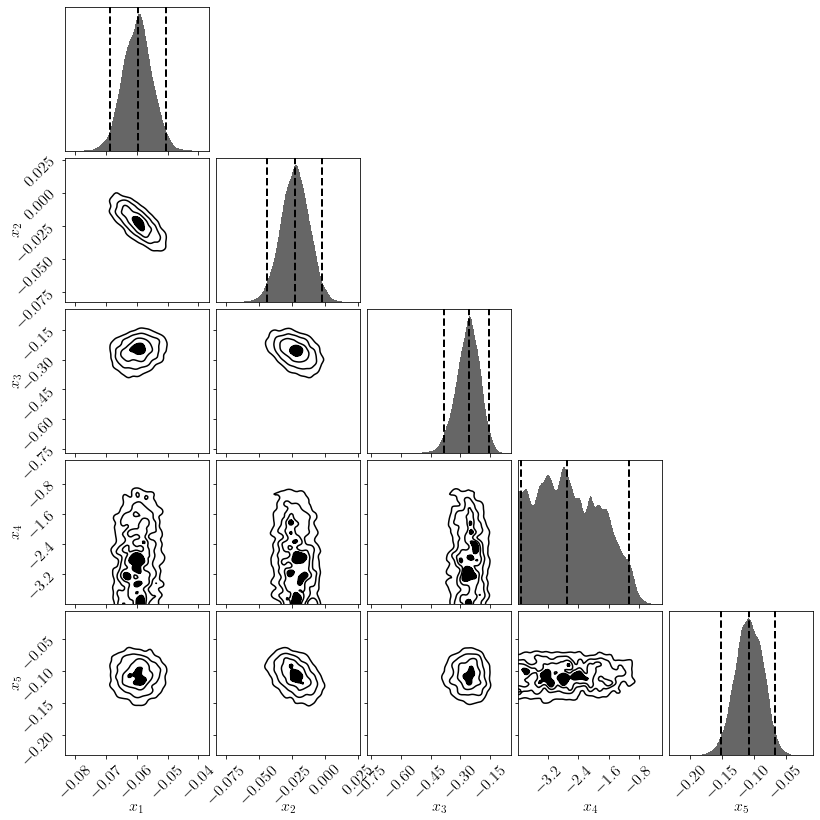

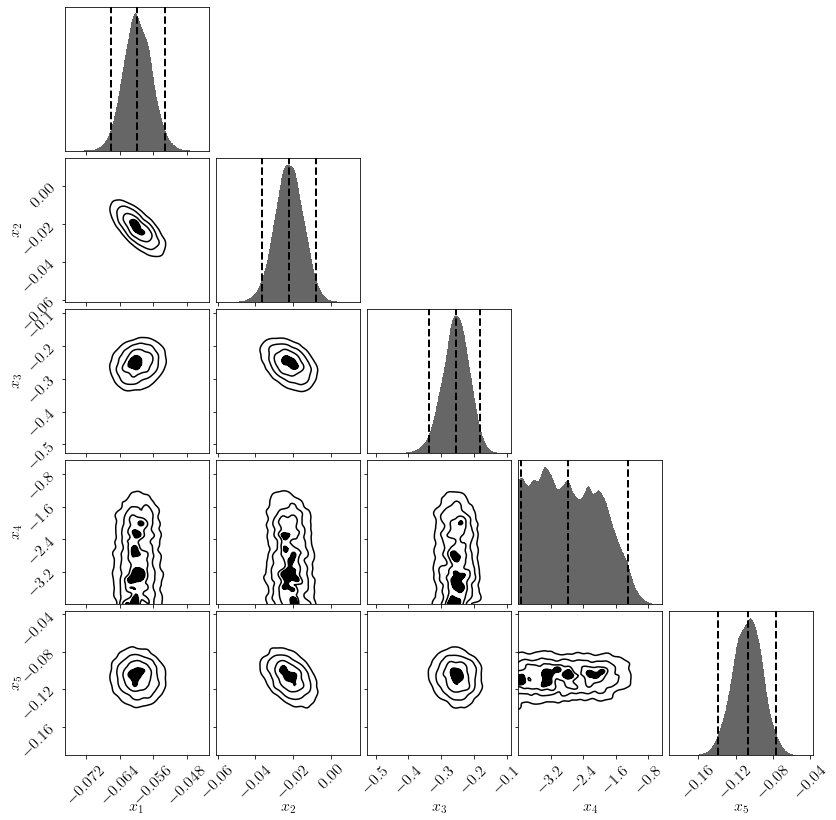

In [275]:
dp.cornerplot(Gsampler['dn'][8].results)
dp.cornerplot(te8)
plt.show()

In [28]:
yzgced_nodm = "/Users/sammcd00/Dropbox/1recently-completed-papers/46wavelets4_cmsz/wavelets4_and_GCE_templates/YZ_template_fit_2021/fit_summary_2021_October/no_dm/"
fgce_nodm = []
i=0
for k in os.listdir(yzgced_nodm):
    if ('4FGLDR2.npy' in k) and ('_nuclear_64' not in k):
        i+=1
        x0 = np.load(yzgced_nodm+k, allow_pickle=True)
        xm = re.split('model_', re.split('_no_dm', k)[0])[1]
        xl=array([x1['loglikelihood'] for x1 in x0], dtype=float)
        fgce_nodm.append([sum(xl),xm])
#         except Exception:
#             print(i)
#             pass

In [30]:
fgcel_nodm = array([y[0] for y in fgce_nodm])
as_lik_nodm = argsort(fgcel_nodm)[::-1]
fgcem_nodm = array([y[1] for y in fgce_nodm])[as_lik_nodm]
fgcel_nodm = sort(fgcel_nodm)[::-1]

In [31]:
fgcem_nodm

array(['7p', 'c4', '7t', '7o', '7u', 'd1', 'cv', '8t', '7n', '80', '93',
       'bs', 'ch', 'bf', '71', '8f', '8l', '9l', 'bh', '1zB', '1yB', 'ba',
       '2r', '2e', '1oB', '9z', '2u', '2c', '1pB', '2w', '2t', '2i',
       '1qB', '2q', '2z', 'ay', '23', '7c', '2g', 'au', '2y', '2v', '2s',
       '2p', '32', '30', '0c', '31', '1sB', '3j', '70', '1xB', '5s', '5q',
       '1nB', '1rB', '6n', '6z', '67', '6e', '3z', '0b', '0a', 'cg', '26',
       '22', '1c', '0g', '24', 'dy', '14', '1d', '1e', '0u', '0t', '0w',
       '1j', '1i', '0v', '1k'], dtype='<U3')

In [56]:
yzgced_bb = "/Users/sammcd00/Dropbox/1recently-completed-papers/46wavelets4_cmsz/wavelets4_and_GCE_templates/YZ_template_fit_2021/fit_summary_2021_October/dm_14/"
fgce_bb = []
i=0
for k in os.listdir(yzgced_bb):
    if ('4FGLDR2.npy' in k) and ('_nuclear_64' not in k):
        i+=1
        x0 = np.load(yzgced_bb+k, allow_pickle=True)
        xm = re.split('model_', re.split('_dm_14', k)[0])[1]
        xl=array([x1['loglikelihood'] for x1 in x0], dtype=float)
        fgce_bb.append([sum(xl),xm])
#         except Exception:
#             print(i)
#             pass

In [57]:
fgcel_bb = array([y[0] for y in fgce_bb])
as_lik_bb = argsort(fgcel_bb)[::-1]
fgcem_bb = array([y[1] for y in fgce_bb])[as_lik_bb]
fgcel_bb = sort(fgcel_bb)[::-1]

In [58]:
fgcem_bb

array(['8t', 'c4', '93', '8l', '8f', '9l', 'ba', '9z', '0c', 'ch', 'bh',
       'ay', 'au', '7p', 'bf', '23', '7n', '0b', '7o', '0a', 'd1', 'cv',
       '7t', 'bs', 'cg', '7u', '80', '71', '1pB', '1qB', '1zB', '1yB',
       '1oB', '1c', '6z', '6n', '2e', '2r', '2t', '2i', '2u', '2c', '2w',
       '67', '2q', '6e', '2g', '2z', '7c', '2s', '2p', '2v', '2y', '0g',
       '1sB', '1xB', '31', '1nB', '26', '5q', '5s', '32', '3j', '30',
       '1rB', '70', '22', '24', '3z', 'dy', '1d', '14', '1e', '1j', '0u',
       '1i', '0t', '0w', '1k', '0v'], dtype='<U3')

In [2]:
yzgced_x = "/Users/sammcd00/Dropbox/1recently-completed-papers/46wavelets4_cmsz/wavelets4_and_GCE_templates/YZ_template_fit_2021/fit_summary_2021_October/dm_15/"
fgce_x = []
i=0
for k in os.listdir(yzgced_x):
    if ('4FGLDR2.npy' in k) and ('_nuclear_64' not in k):
        i+=1
        x0 = np.load(yzgced_x+k, allow_pickle=True)
        xm = re.split('model_', re.split('_dm_15', k)[0])[1]
        xl=array([x1['loglikelihood'] for x1 in x0], dtype=float)
        fgce_x.append([sum(xl),xm])
#         except Exception:
#             print(i)
#             pass

In [3]:
fgcel_x = array([y[0] for y in fgce_x])
as_lik_x = argsort(fgcel_x)[::-1]
fgcem_x = array([y[1] for y in fgce_x])[as_lik_x]
fgcel_x = sort(fgcel_x)[::-1]

In [4]:
fgcem_x

array(['c4', '8t', '7p', '93', '7o', '7n', 'd1', 'cv', 'ch', '8l', '8f',
       'bf', '7t', '9l', '7u', 'bh', 'ba', 'bs', '9z', '23', 'ay', '80',
       'au', '71', '0c', '1pB', '1qB', '1zB', '1yB', '1oB', '0b', '0a',
       '2e', '2r', '7c', '2u', '2c', '2w', '2t', '2i', '2q', '2z', 'cg',
       '2g', '2y', '2v', '2s', '2p', '32', '6n', '70', '31', '6z', '1sB',
       '3j', '30', '1xB', '67', '5s', '6e', '1nB', '5q', '1rB', '3z',
       '1c', '26', '22', '0g', '24', 'dy', '1d', '14', '1e', '0u', '0t',
       '1j', '1i', '0w', '0v', '1k'], dtype='<U3')

In [5]:
yzgced_sb = "/Users/sammcd00/Dropbox/1recently-completed-papers/46wavelets4_cmsz/wavelets4_and_GCE_templates/YZ_template_fit_2021/fit_summary_2021_October/dm_64/"
fgce_sb = []
i=0
for k in os.listdir(yzgced_sb):
    if ('4FGLDR2.npy' in k) and ('_nuclear_64' not in k):
        i+=1
        x0 = np.load(yzgced_sb+k, allow_pickle=True)
        xm = re.split('model_', re.split('_dm_64', k)[0])[1]
        xl=array([x1['loglikelihood'] for x1 in x0], dtype=float)
        fgce_sb.append([sum(xl),xm])
#         except Exception:
#             print(i)
#             pass

In [6]:
fgcel_sb = array([y[0] for y in fgce_sb])
as_lik_sb = argsort(fgcel_sb)[::-1]
fgcem_sb = array([y[1] for y in fgce_sb])[as_lik_sb]
fgcel_sb = sort(fgcel_sb)[::-1]

In [7]:
fgcem_sb

array(['8t', 'c4', '8l', '93', '8f', '9l', 'ba', '9z', 'ch', '0c', 'bh',
       'ay', 'au', 'bf', '7p', '23', '0b', '7n', '7o', '0a', 'd1', 'cv',
       'bs', '7t', 'cg', '7u', '80', '71', '1pB', '1qB', '1zB', '1yB',
       '1oB', '1c', '6z', '6n', '2e', '2r', '2i', '67', '2t', '6e', '2c',
       '2w', '2u', '2q', '2g', '2z', '2s', '7c', '2p', '2v', '2y', '0g',
       '1xB', '1sB', '26', '31', '1nB', '5q', '5s', '3j', '32', '1rB',
       '30', '70', '22', '24', '3z', 'dy', '1d', '14', '1e', '1j', '0u',
       '1i', '0t', '0w', '1k', '0v'], dtype='<U3')

# Now numpyro stuff

In [14]:
rng_key = jax.random.PRNGKey(0)

In [16]:
#not using this now, since I'm initializing from the dynesty results, but it could be useful at some point
def ivrand(rk, dim):
    return jax.random.uniform(rk, (dim,))*(pmax[:dim]-pmin[:dim])+pmin[:dim]

In [37]:
rng_key, rng_key_ = jax.random.split(rng_key)
for i in range(14):
    dm_samp_dict['nr_sampler'][i] = nr.infer.MCMC(nr.infer.NUTS(potential_fn = lambda t: -jjlnprob(t, bin_no=i, ex_num=1)),
                                               num_samples=5000, num_warmup=500, jit_model_args=True, chain_method='vectorized')
    dm_samp_dict['nr_sampler'][i].run(rng_key_, init_params =  yzbestvals[i])#jax.random.uniform(rng_key_, (19,))*(pmax-pmin)+pmin)#
    a, b = -dm_samp_dict['nr_sampler'][i].last_state.potential_energy, jjlnprob( yzbestvals[i], i )
    c = dm_samp_dict['nr_sampler'][i].last_state.z[18]
    print('E'+str(i)+f': LLHMC={a:.2f}, LLemcee={b:.2f}, HMC is better by {(a-b):.2f}' )
    print('     '+f'best DM norm {c:.2f}' )

sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [03:55<00:00, 23.40it/s, 23 steps of size 2.56e-02. acc. prob=0.64]


E0: LLHMC=-92947.45, LLemcee=-93002.86, HMC is better by 55.41
     best DM norm -0.01


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [28:42<00:00,  3.19it/s, 57 steps of size 2.88e-03. acc. prob=0.97]


E1: LLHMC=-118172.38, LLemcee=-119765.36, HMC is better by 1592.98
     best DM norm 0.07


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [07:18<00:00, 12.53it/s, 15 steps of size 1.94e-02. acc. prob=0.88]


E2: LLHMC=-149454.98, LLemcee=-149675.06, HMC is better by 220.08
     best DM norm 0.22


sample: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [07:20<00:00, 12.48it/s, 129 steps of size 1.20e-02. acc. prob=0.89]


E3: LLHMC=-179950.47, LLemcee=-180284.38, HMC is better by 333.91
     best DM norm 0.01


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:11<00:00, 77.34it/s, 2 steps of size 1.82e-02. acc. prob=0.79]


E4: LLHMC=-194463.34, LLemcee=-194486.33, HMC is better by 22.98
     best DM norm -0.03


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:29<00:00, 61.71it/s, 1 steps of size 6.09e-03. acc. prob=0.84]


E5: LLHMC=-195266.77, LLemcee=-195283.20, HMC is better by 16.44
     best DM norm 0.03


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:33<00:00, 58.98it/s, 2 steps of size 8.13e-03. acc. prob=0.85]


E6: LLHMC=-186599.30, LLemcee=-186659.97, HMC is better by 60.67
     best DM norm -0.05


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:28<00:00, 62.20it/s, 1 steps of size 1.76e-02. acc. prob=0.84]


E7: LLHMC=-169021.75, LLemcee=-169038.02, HMC is better by 16.27
     best DM norm -0.11


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [00:59<00:00, 92.26it/s, 2 steps of size 8.57e-02. acc. prob=0.72]


E8: LLHMC=-151554.23, LLemcee=-151623.70, HMC is better by 69.47
     best DM norm -0.43


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:04<00:00, 85.39it/s, 2 steps of size 1.31e-01. acc. prob=0.69]


E9: LLHMC=-126215.51, LLemcee=-126326.07, HMC is better by 110.56
     best DM norm -0.13


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:13<00:00, 75.26it/s, 1 steps of size 1.39e-01. acc. prob=0.78]


E10: LLHMC=-103768.01, LLemcee=-103781.65, HMC is better by 13.64
     best DM norm -0.52


sample: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [55:53<00:00,  1.64it/s, 833 steps of size 7.43e-04. acc. prob=0.99]


E11: LLHMC=-125636.88, LLemcee=-125902.17, HMC is better by 265.30
     best DM norm -0.85


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:21<00:00, 67.21it/s, 26 steps of size 4.91e-02. acc. prob=0.68]


E12: LLHMC=-61937.17, LLemcee=-61971.48, HMC is better by 34.31
     best DM norm -1.57


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:52<00:00, 49.05it/s, 18 steps of size 3.73e-02. acc. prob=0.75]


E13: LLHMC=-28364.52, LLemcee=-28408.82, HMC is better by 44.30
     best DM norm 0.79


In [38]:
rng_key, rng_key_ = jax.random.split(rng_key)
for i in range(14):
    bx_samp_dict['nr_sampler'][i] = nr.infer.MCMC(nr.infer.NUTS(potential_fn = lambda t: -jjlnprob(t, bin_no=i, ex_num=5)),
                                               num_samples=5000, num_warmup=500, jit_model_args=True, chain_method='vectorized')
    bx_samp_dict['nr_sampler'][i].run(rng_key_, init_params =  ivrand(rng_key_, 20))#
    a, b = -bx_samp_dict['nr_sampler'][i].last_state.potential_energy, -dm_samp_dict['nr_sampler'][i].last_state.potential_energy
    print('E'+str(i)+f': LL_BX={a:.2f}, LL_DM={b:.2f}, DM is better by {(b-a):.2f}' )

sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [03:37<00:00, 25.31it/s, 15 steps of size 2.45e-02. acc. prob=0.83]


E0: LL_BX=-92947.83, LL_DM=-92947.45, DM is better by 0.38


sample: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [26:11<00:00,  3.50it/s, 1023 steps of size 2.74e-03. acc. prob=0.90]


E1: LL_BX=-118164.41, LL_DM=-118172.38, DM is better by -7.97


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [02:02<00:00, 44.78it/s, 4 steps of size 3.37e-02. acc. prob=0.36]


E2: LL_BX=-149450.02, LL_DM=-149454.98, DM is better by -4.97


sample: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [51:48<00:00,  1.77it/s, 837 steps of size 9.56e-04. acc. prob=0.95]


E3: LL_BX=-179943.06, LL_DM=-179950.47, DM is better by -7.41


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [00:52<00:00, 104.97it/s, 3 steps of size 1.62e-03. acc. prob=0.62]


E4: LL_BX=-194658.92, LL_DM=-194463.34, DM is better by 195.58


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [00:46<00:00, 119.47it/s, 2 steps of size 2.42e-02. acc. prob=0.65]


E5: LL_BX=-195258.64, LL_DM=-195266.77, DM is better by -8.12


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:02<00:00, 87.78it/s, 2 steps of size 2.51e-02. acc. prob=0.71]


E6: LL_BX=-186433.55, LL_DM=-186599.30, DM is better by -165.75


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:16<00:00, 72.35it/s, 2 steps of size 3.21e-02. acc. prob=0.79]


E7: LL_BX=-168864.80, LL_DM=-169021.75, DM is better by -156.95


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [09:42<00:00,  9.44it/s, 25 steps of size 4.79e-05. acc. prob=0.97]


E8: LL_BX=-151473.47, LL_DM=-151554.23, DM is better by -80.77


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [02:19<00:00, 39.30it/s, 17 steps of size 4.63e-02. acc. prob=0.88]


E9: LL_BX=-126151.64, LL_DM=-126215.51, DM is better by -63.87


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:48<00:00, 50.88it/s, 3 steps of size 9.39e-02. acc. prob=0.85]


E10: LL_BX=-103732.84, LL_DM=-103768.01, DM is better by -35.16


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [00:57<00:00, 95.06it/s, 2 steps of size 1.98e-02. acc. prob=0.46]


E11: LL_BX=-125620.83, LL_DM=-125636.88, DM is better by -16.05


sample: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [07:51<00:00, 11.66it/s, 141 steps of size 9.43e-03. acc. prob=0.83]


E12: LL_BX=-61934.38, LL_DM=-61937.17, DM is better by -2.79


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [03:02<00:00, 30.10it/s, 67 steps of size 2.75e-02. acc. prob=0.78]

E13: LL_BX=-28365.98, LL_DM=-28364.52, DM is better by 1.46


In [ ]:
rng_key, rng_key_ = jax.random.split(rng_key)
for i in range(14):
    bx_samp_dict['nr_sampler'][i].run(rng_key_, init_params =  append(bb_samp_dict['nr_sampler'][i].last_state.z, [-1]))#
    a, b = -bx_samp_dict['nr_sampler'][i].last_state.potential_energy, -dm_samp_dict['nr_sampler'][i].last_state.potential_energy
    print('E'+str(i)+f': LL_BX={a:.2f}, LL_DM={b:.2f}, DM is better by {(b-a):.2f}' )

sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [07:06<00:00, 12.90it/s, 89 steps of size 1.12e-02. acc. prob=0.83]


E0: LL_BX=-92946.06, LL_DM=-92947.45, DM is better by -1.38


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [03:45<00:00, 24.35it/s, 16 steps of size 2.28e-02. acc. prob=0.73]


E1: LL_BX=-118165.35, LL_DM=-118172.38, DM is better by -7.02


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [04:03<00:00, 22.55it/s, 9 steps of size 7.46e-03. acc. prob=0.24]


E2: LL_BX=-149450.14, LL_DM=-149454.98, DM is better by -4.84


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [04:02<00:00, 22.65it/s, 36 steps of size 2.31e-02. acc. prob=0.85]


E3: LL_BX=-179941.77, LL_DM=-179950.47, DM is better by -8.70


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [00:55<00:00, 99.75it/s, 7 steps of size 3.27e-02. acc. prob=0.72]


E4: LL_BX=-194481.44, LL_DM=-194463.34, DM is better by 18.09


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:03<00:00, 86.42it/s, 7 steps of size 1.18e-02. acc. prob=0.76]


E5: LL_BX=-195243.39, LL_DM=-195266.77, DM is better by -23.38


sample: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [4:01:33<00:00,  2.64s/it, 14 steps of size 8.29e-03. acc. prob=0.85]


E6: LL_BX=-186499.42, LL_DM=-186599.30, DM is better by -99.88


sample: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [2:01:10<00:00,  1.32s/it, 13 steps of size 1.66e-02. acc. prob=0.85]


E7: LL_BX=-168863.17, LL_DM=-169021.75, DM is better by -158.58


sample: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [4:01:49<00:00,  2.64s/it, 12 steps of size 2.04e-02. acc. prob=0.87]


E8: LL_BX=-151438.48, LL_DM=-151554.23, DM is better by -115.75


sample:  38%|██████████████████████████████████████████████████████████████████████████▍                                                                                                                        | 2101/5500 [1:57:50<00:56, 59.96it/s, 27 steps of size 7.01e-02. acc. prob=0.82]

In [40]:
rng_key, rng_key_ = jax.random.split(rng_key)
for i in range(14):
    sb_samp_dict['nr_sampler'][i] = nr.infer.MCMC(nr.infer.NUTS(potential_fn = lambda t: -jjlnprob(t, bin_no=i, ex_num=4)),
                                               num_samples=5000, num_warmup=500, jit_model_args=True, chain_method='vectorized')
    sb_samp_dict['nr_sampler'][i].run(rng_key_, init_params =  ivrand(rng_key_, 19))#
    a, b = -sb_samp_dict['nr_sampler'][i].last_state.potential_energy, -dm_samp_dict['nr_sampler'][i].last_state.potential_energy
    print('E'+str(i)+f': LL_BX={a:.2f}, LL_DM={b:.2f}, DM is better by {(b-a):.2f}' )

sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [03:21<00:00, 27.30it/s, 44 steps of size 2.70e-02. acc. prob=0.72]


E0: LL_BX=-92947.47, LL_DM=-92947.45, DM is better by 0.02


sample: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [06:38<00:00, 13.81it/s, 131 steps of size 2.53e-02. acc. prob=0.79]


E1: LL_BX=-118167.60, LL_DM=-118172.38, DM is better by -4.77


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [37:35<00:00,  2.44it/s, 25 steps of size 2.33e-03. acc. prob=0.84]


E2: LL_BX=-149441.77, LL_DM=-149454.98, DM is better by -13.22


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:51<00:00, 49.20it/s, 14 steps of size 5.41e-02. acc. prob=0.73]


E3: LL_BX=-183863.92, LL_DM=-179950.47, DM is better by 3913.45


sample: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [11:37<00:00,  7.89it/s, 150 steps of size 1.57e-03. acc. prob=0.97]


E4: LL_BX=-194788.19, LL_DM=-194463.34, DM is better by 324.84


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [02:23<00:00, 38.43it/s, 11 steps of size 2.45e-03. acc. prob=0.88]


E5: LL_BX=-197755.70, LL_DM=-195266.77, DM is better by 2488.94


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:21<00:00, 67.89it/s, 14 steps of size 2.73e-01. acc. prob=0.70]


E6: LL_BX=-187582.25, LL_DM=-186599.30, DM is better by 982.95


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:27<00:00, 62.90it/s, 6 steps of size 1.53e-02. acc. prob=0.82]


E7: LL_BX=-170762.83, LL_DM=-169021.75, DM is better by 1741.08


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [02:47<00:00, 32.74it/s, 22 steps of size 1.31e-02. acc. prob=0.91]


E8: LL_BX=-152913.39, LL_DM=-151554.23, DM is better by 1359.16


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:23<00:00, 65.66it/s, 6 steps of size 6.68e-02. acc. prob=0.81]


E9: LL_BX=-126201.25, LL_DM=-126215.51, DM is better by -14.26


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [00:45<00:00, 119.71it/s, 2 steps of size 9.54e-02. acc. prob=0.08]


E10: LL_BX=-103797.08, LL_DM=-103768.01, DM is better by 29.07


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [05:43<00:00, 16.01it/s, 33 steps of size 2.05e-02. acc. prob=0.87]


E11: LL_BX=-125591.38, LL_DM=-125636.88, DM is better by -45.49


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [03:25<00:00, 26.70it/s, 48 steps of size 2.11e-02. acc. prob=0.80]


E12: LL_BX=-61934.24, LL_DM=-61937.17, DM is better by -2.93


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:58<00:00, 46.44it/s, 4 steps of size 4.95e-02. acc. prob=0.67]

E13: LL_BX=-28369.81, LL_DM=-28364.52, DM is better by 5.29


In [44]:
rng_key, rng_key_ = jax.random.split(rng_key)
for i in range(14):
    sb_samp_dict['nr_sampler'][i].run(rng_key_, init_params =  ivrand(rng_key_, 19))#
    a, b = -sb_samp_dict['nr_sampler'][i].last_state.potential_energy, -dm_samp_dict['nr_sampler'][i].last_state.potential_energy
    print('E'+str(i)+f': LL_BX={a:.2f}, LL_DM={b:.2f}, DM is better by {(b-a):.2f}' )

sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [02:15<00:00, 40.55it/s, 2 steps of size 5.34e-02. acc. prob=0.60]


E0: LL_BX=-92948.48, LL_DM=-92947.45, DM is better by 1.04


sample: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [29:06<00:00,  3.15it/s, 192 steps of size 2.70e-03. acc. prob=0.91]


E1: LL_BX=-118168.05, LL_DM=-118172.38, DM is better by -4.33


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [04:13<00:00, 21.73it/s, 30 steps of size 2.72e-02. acc. prob=0.76]


E2: LL_BX=-149442.42, LL_DM=-149454.98, DM is better by -12.56


sample: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [04:16<00:00, 21.44it/s, 105 steps of size 2.16e-02. acc. prob=0.71]


E3: LL_BX=-179938.45, LL_DM=-179950.47, DM is better by -12.02


sample: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [00:54<00:00, 101.28it/s, 20 steps of size 1.61e-02. acc. prob=0.76]


E4: LL_BX=-195515.69, LL_DM=-194463.34, DM is better by 1052.34


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:11<00:00, 77.28it/s, 27 steps of size 6.36e-03. acc. prob=0.82]


E5: LL_BX=-196349.73, LL_DM=-195266.77, DM is better by 1082.97


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [03:03<00:00, 29.90it/s, 87 steps of size 3.09e-03. acc. prob=0.93]


E6: LL_BX=-187295.53, LL_DM=-186599.30, DM is better by 696.23


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [00:57<00:00, 95.11it/s, 26 steps of size 2.47e-02. acc. prob=0.79]


E7: LL_BX=-169502.02, LL_DM=-169021.75, DM is better by 480.27


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:08<00:00, 80.30it/s, 25 steps of size 4.31e-02. acc. prob=0.82]


E8: LL_BX=-151937.80, LL_DM=-151554.23, DM is better by 383.56


sample: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [07:08<00:00, 12.84it/s, 267 steps of size 9.60e-03. acc. prob=0.91]


E9: LL_BX=-126183.35, LL_DM=-126215.51, DM is better by -32.16


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [00:52<00:00, 104.29it/s, 7 steps of size 4.93e-02. acc. prob=0.12]


E10: LL_BX=-103726.60, LL_DM=-103768.01, DM is better by -41.41


sample: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [10:23<00:00,  8.83it/s, 246 steps of size 5.30e-03. acc. prob=0.77]


E11: LL_BX=-125595.14, LL_DM=-125636.88, DM is better by -41.73


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [02:11<00:00, 41.86it/s, 12 steps of size 3.98e-02. acc. prob=0.75]


E12: LL_BX=-61932.71, LL_DM=-61937.17, DM is better by -4.46


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:34<00:00, 57.96it/s, 20 steps of size 3.90e-02. acc. prob=0.39]

E13: LL_BX=-28365.57, LL_DM=-28364.52, DM is better by 1.05


In [45]:
rng_key, rng_key_ = jax.random.split(rng_key)
for i in range(14):
    sb_samp_dict['nr_sampler'][i].run(rng_key_, init_params =  yzbestvals[i])#
    a, b = -sb_samp_dict['nr_sampler'][i].last_state.potential_energy, -dm_samp_dict['nr_sampler'][i].last_state.potential_energy
    print('E'+str(i)+f': LL_BX={a:.2f}, LL_DM={b:.2f}, DM is better by {(b-a):.2f}' )

sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [02:19<00:00, 39.37it/s, 2 steps of size 6.11e-02. acc. prob=0.61]


E0: LL_BX=-92945.46, LL_DM=-92947.45, DM is better by -1.98


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [44:16<00:00,  2.07it/s, 32 steps of size 1.38e-03. acc. prob=0.98]


E1: LL_BX=-118167.20, LL_DM=-118172.38, DM is better by -5.18


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [05:08<00:00, 17.83it/s, 14 steps of size 2.21e-02. acc. prob=0.86]


E2: LL_BX=-149449.56, LL_DM=-149454.98, DM is better by -5.42


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [02:12<00:00, 41.45it/s, 3 steps of size 2.45e-02. acc. prob=0.24]


E3: LL_BX=-179937.47, LL_DM=-179950.47, DM is better by -13.00


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [00:41<00:00, 133.83it/s, 3 steps of size 4.82e-02. acc. prob=0.66]


E4: LL_BX=-194452.11, LL_DM=-194463.34, DM is better by -11.23


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [00:46<00:00, 117.44it/s, 3 steps of size 2.09e-02. acc. prob=0.66]


E5: LL_BX=-195184.06, LL_DM=-195266.77, DM is better by -82.70


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [00:44<00:00, 123.85it/s, 3 steps of size 2.70e-02. acc. prob=0.70]


E6: LL_BX=-186441.81, LL_DM=-186599.30, DM is better by -157.48


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [00:44<00:00, 123.91it/s, 3 steps of size 5.30e-02. acc. prob=0.68]


E7: LL_BX=-168866.69, LL_DM=-169021.75, DM is better by -155.06


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [00:39<00:00, 138.75it/s, 2 steps of size 1.31e-01. acc. prob=0.64]


E8: LL_BX=-151433.59, LL_DM=-151554.23, DM is better by -120.64


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [00:58<00:00, 94.82it/s, 7 steps of size 1.57e-01. acc. prob=0.74]


E9: LL_BX=-126128.70, LL_DM=-126215.51, DM is better by -86.80


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:23<00:00, 65.71it/s, 8 steps of size 1.34e-01. acc. prob=0.80]


E10: LL_BX=-103715.31, LL_DM=-103768.01, DM is better by -52.70


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [02:17<00:00, 39.88it/s, 15 steps of size 7.96e-02. acc. prob=0.86]


E11: LL_BX=-125588.16, LL_DM=-125636.88, DM is better by -48.71


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:31<00:00, 60.32it/s, 3 steps of size 4.80e-02. acc. prob=0.67]


E12: LL_BX=-61931.10, LL_DM=-61937.17, DM is better by -6.07


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [03:51<00:00, 23.73it/s, 7 steps of size 1.82e-02. acc. prob=0.90]

E13: LL_BX=-28364.82, LL_DM=-28364.52, DM is better by 0.30


In [49]:
rng_key, rng_key_ = jax.random.split(rng_key)
for i in range(1,14):
    nodm_e_samp_dict['nr_sampler'][i] = nr.infer.MCMC(nr.infer.NUTS(potential_fn = lambda t: -jjlnprob(t, bin_no=i, ex_num=0)),
                                                   num_samples=5000, num_warmup=500, jit_model_args=True, chain_method='vectorized')
    nodm_e_samp_dict['nr_sampler'][i].run(rng_key_, init_params = yzbestvals[i][:-1])#jax.random.uniform(rng_key_, (18,))*(pmax[:-1]-pmin[:-1])+pmin[:-1])# 
    a, b = -nodm_e_samp_dict['nr_sampler'][i].last_state.potential_energy, -dm_samp_dict['nr_sampler'][i].last_state.potential_energy
#     c = e_samp_dict['nr_sampler'][i].last_state.z[18]
    print('E'+str(i)+f': LLHMC_noDM={a:.2f}, LL_DM={b:.2f}, with DM is better by {(b-a):.2f}' )
#     print('     '+f'best DM norm {c:.2f}' )

sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [02:14<00:00, 40.97it/s, 3 steps of size 3.19e-02. acc. prob=0.43]


E1: LLHMC_noDM=-118173.79, LL_DM=-118172.38, with DM is better by 1.41


sample: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [29:59<00:00,  3.06it/s, 276 steps of size 2.79e-03. acc. prob=0.82]


E2: LLHMC_noDM=-149465.08, LL_DM=-149454.98, with DM is better by 10.09


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [02:56<00:00, 31.25it/s, 14 steps of size 4.36e-02. acc. prob=0.68]


E3: LLHMC_noDM=-179966.38, LL_DM=-179950.47, with DM is better by 15.91


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:01<00:00, 89.47it/s, 13 steps of size 1.76e-02. acc. prob=0.81]


E4: LLHMC_noDM=-194594.94, LL_DM=-194463.34, with DM is better by 131.59


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:37<00:00, 56.16it/s, 27 steps of size 4.42e-03. acc. prob=0.88]


E5: LLHMC_noDM=-195547.98, LL_DM=-195266.77, with DM is better by 281.22


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:34<00:00, 58.32it/s, 26 steps of size 7.01e-03. acc. prob=0.87]


E6: LLHMC_noDM=-186831.47, LL_DM=-186599.30, with DM is better by 232.17


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:20<00:00, 68.68it/s, 17 steps of size 1.69e-02. acc. prob=0.85]


E7: LLHMC_noDM=-169052.41, LL_DM=-169021.75, with DM is better by 30.66


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:12<00:00, 76.03it/s, 17 steps of size 3.98e-02. acc. prob=0.83]


E8: LLHMC_noDM=-151566.97, LL_DM=-151554.23, with DM is better by 12.73


sample: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [02:19<00:00, 39.43it/s, 111 steps of size 3.18e-02. acc. prob=0.90]


E9: LLHMC_noDM=-126265.40, LL_DM=-126215.51, with DM is better by 49.89


sample: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [07:58<00:00, 11.49it/s, 239 steps of size 9.10e-03. acc. prob=0.97]


E10: LLHMC_noDM=-103771.41, LL_DM=-103768.01, with DM is better by 3.41


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:13<00:00, 75.30it/s, 31 steps of size 6.94e-02. acc. prob=0.65]


E11: LLHMC_noDM=-125638.40, LL_DM=-125636.88, with DM is better by 1.52


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:25<00:00, 64.19it/s, 20 steps of size 1.11e-01. acc. prob=0.68]


E12: LLHMC_noDM=-61940.36, LL_DM=-61937.17, with DM is better by 3.19


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [03:02<00:00, 30.19it/s, 30 steps of size 1.93e-02. acc. prob=0.85]


E13: LLHMC_noDM=-28365.62, LL_DM=-28364.52, with DM is better by 1.10


In [52]:
rng_key, rng_key_ = jax.random.split(rng_key)
for i in range(14):
    x_samp_dict['nr_sampler'][i] = nr.infer.MCMC(nr.infer.NUTS(potential_fn = lambda t: -jjlnprob(t, bin_no=i, ex_num=3)),
                                              num_samples=5000, num_warmup=500, jit_model_args=True, chain_method='vectorized')
    x_samp_dict['nr_sampler'][i].run(rng_key_, init_params = yzbestvals[i])#jax.random.uniform(rng_key_, (18,))*(pmax[:-1]-pmin[:-1])+pmin[:-1])# 
    a, b = -x_samp_dict['nr_sampler'][i].last_state.potential_energy, -dm_samp_dict['nr_sampler'][i].last_state.potential_energy
    print('E'+str(i)+f': LL_X={a:.2f}, LL_DM={b:.2f}, with DM is better by {(b-a):.2f}' )

sample: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [05:33<00:00, 16.49it/s, 103 steps of size 1.35e-02. acc. prob=0.83]


E0: LL_X=-92950.23, LL_DM=-92947.45, with DM is better by 2.78


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [04:18<00:00, 21.29it/s, 70 steps of size 2.14e-02. acc. prob=0.79]


E1: LL_X=-118178.30, LL_DM=-118172.38, with DM is better by 5.93


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:32<00:00, 59.34it/s, 7 steps of size 2.22e-02. acc. prob=0.17]


E2: LL_X=-149463.89, LL_DM=-149454.98, with DM is better by 8.91


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [16:11<00:00,  5.66it/s, 9 steps of size 4.17e-03. acc. prob=0.86]


E3: LL_X=-179967.00, LL_DM=-179950.47, with DM is better by 16.53


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:13<00:00, 74.55it/s, 3 steps of size 1.32e-02. acc. prob=0.82]


E4: LL_X=-194555.50, LL_DM=-194463.34, with DM is better by 92.16


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:55<00:00, 47.72it/s, 1 steps of size 3.88e-03. acc. prob=0.88]


E5: LL_X=-195386.66, LL_DM=-195266.77, with DM is better by 119.89


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [00:50<00:00, 109.30it/s, 2 steps of size 1.65e-02. acc. prob=0.74]


E6: LL_X=-186699.58, LL_DM=-186599.30, with DM is better by 100.28


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:06<00:00, 83.32it/s, 13 steps of size 2.33e-02. acc. prob=0.79]


E7: LL_X=-169077.81, LL_DM=-169021.75, with DM is better by 56.06


sample: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [00:48<00:00, 112.73it/s, 11 steps of size 6.92e-02. acc. prob=0.72]


E8: LL_X=-151559.91, LL_DM=-151554.23, with DM is better by 5.67


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:47<00:00, 50.96it/s, 22 steps of size 3.93e-02. acc. prob=0.83]


E9: LL_X=-126219.34, LL_DM=-126215.51, with DM is better by 3.84


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [03:30<00:00, 26.15it/s, 4 steps of size 2.05e-02. acc. prob=0.92]


E10: LL_X=-103756.71, LL_DM=-103768.01, with DM is better by -11.30


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:42<00:00, 53.64it/s, 11 steps of size 5.13e-02. acc. prob=0.82]


E11: LL_X=-125635.57, LL_DM=-125636.88, with DM is better by -1.30


sample: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [07:23<00:00, 12.40it/s, 312 steps of size 7.77e-03. acc. prob=0.95]


E12: LL_X=-61939.87, LL_DM=-61937.17, with DM is better by 2.70


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:57<00:00, 46.65it/s, 88 steps of size 3.94e-02. acc. prob=0.78]

E13: LL_X=-28364.95, LL_DM=-28364.52, with DM is better by 0.43


In [54]:
rng_key, rng_key_ = jax.random.split(rng_key)
for i in range(14):
    bb_samp_dict['nr_sampler'][i] = nr.infer.MCMC(nr.infer.NUTS(potential_fn = lambda t: -jjlnprob(t, bin_no=i, ex_num=2)),
                                               num_samples=5000, num_warmup=500, jit_model_args=True, chain_method='vectorized')
    bb_samp_dict['nr_sampler'][i].run(rng_key_, init_params = yzbestvals[i])#jax.random.uniform(rng_key_, (18,))*(pmax[:-1]-pmin[:-1])+pmin[:-1])# 
    a, b = -bb_samp_dict['nr_sampler'][i].last_state.potential_energy, -dm_samp_dict['nr_sampler'][i].last_state.potential_energy
    print('E'+str(i)+f': LL_X={a:.2f}, LL_DM={b:.2f}, with DM is better by {(b-a):.2f}' )

sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [03:02<00:00, 30.13it/s, 7 steps of size 4.50e-02. acc. prob=0.78]


E0: LL_X=-92948.27, LL_DM=-92947.45, with DM is better by 0.82


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [02:55<00:00, 31.37it/s, 25 steps of size 4.56e-02. acc. prob=0.64]


E1: LL_X=-118170.54, LL_DM=-118172.38, with DM is better by -1.84


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [08:50<00:00, 10.37it/s, 13 steps of size 1.33e-02. acc. prob=0.91]


E2: LL_X=-149441.48, LL_DM=-149454.98, with DM is better by -13.50


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [04:30<00:00, 20.36it/s, 3 steps of size 2.30e-02. acc. prob=0.79]


E3: LL_X=-179933.81, LL_DM=-179950.47, with DM is better by -16.66


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [00:56<00:00, 97.94it/s, 10 steps of size 3.86e-02. acc. prob=0.70]


E4: LL_X=-194458.39, LL_DM=-194463.34, with DM is better by -4.95


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:12<00:00, 76.16it/s, 11 steps of size 9.68e-03. acc. prob=0.79]


E5: LL_X=-195180.83, LL_DM=-195266.77, with DM is better by -85.94


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:01<00:00, 88.98it/s, 11 steps of size 1.65e-02. acc. prob=0.76]


E6: LL_X=-186431.52, LL_DM=-186599.30, with DM is better by -167.78


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [00:41<00:00, 133.22it/s, 9 steps of size 6.05e-02. acc. prob=0.66]


E7: LL_X=-168860.17, LL_DM=-169021.75, with DM is better by -161.58


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:20<00:00, 68.11it/s, 13 steps of size 3.90e-02. acc. prob=0.84]


E8: LL_X=-151436.02, LL_DM=-151554.23, with DM is better by -118.22


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:05<00:00, 84.24it/s, 10 steps of size 1.73e-01. acc. prob=0.71]


E9: LL_X=-126129.72, LL_DM=-126215.51, with DM is better by -85.79


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [02:47<00:00, 32.92it/s, 15 steps of size 5.14e-02. acc. prob=0.89]


E10: LL_X=-103716.84, LL_DM=-103768.01, with DM is better by -51.17


sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:26<00:00, 63.71it/s, 10 steps of size 6.94e-02. acc. prob=0.75]


E11: LL_X=-125588.51, LL_DM=-125636.88, with DM is better by -48.37


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:13<00:00, 74.39it/s, 3 steps of size 5.50e-02. acc. prob=0.54]


E12: LL_X=-61931.73, LL_DM=-61937.17, with DM is better by -5.44


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5500/5500 [01:11<00:00, 77.07it/s, 9 steps of size 8.00e-02. acc. prob=0.62]

E13: LL_X=-28364.72, LL_DM=-28364.52, with DM is better by 0.20


In [63]:
-bb_samp_dict['nr_sampler'][12].last_state.potential_energy

DeviceArray(-61931.734, dtype=float32)

In [65]:
jnp.array([max(jnp.array([jjlnprob(z, bin_no=i, ex_num=2) for z in bb_samp_dict['nr_sampler'][i].get_samples()])) for i in range(14)])

DeviceArray([ -92940.1  , -118159.016, -149437.95 , -179931.28 ,
             -194455.66 , -195179.64 , -186429.   , -168855.17 ,
             -151431.27 , -126127.48 , -103708.38 , -125584.46 ,
              -61929.31 ,  -28358.379], dtype=float32)

In [69]:
jnp.array([-bb_samp_dict['nr_sampler'][i].last_state.potential_energy for i in range(14)])

DeviceArray([ -92948.266, -118170.54 , -149441.48 , -179933.81 ,
             -194458.39 , -195180.83 , -186431.52 , -168860.17 ,
             -151436.02 , -126129.72 , -103716.836, -125588.51 ,
              -61931.734,  -28364.717], dtype=float32)

In [73]:
a=0
for d in [nodm_e_samp_dict, dm_samp_dict, bb_samp_dict, x_samp_dict, sb_samp_dict, bx_samp_dict]:
    d['best_LL'] = jnp.array([max(jnp.array([jjlnprob(z, bin_no=i, ex_num=a) for z in d['nr_sampler'][i].get_samples()])) for i in range(14)])
    a+=1

In [79]:
max(jnp.array([sum(d['best_LL']) for d in [nodm_e_samp_dict, dm_samp_dict, bb_samp_dict, x_samp_dict, sb_samp_dict, bx_samp_dict]])) - jnp.array([sum(d['best_LL']) for d in [nodm_e_samp_dict, dm_samp_dict, bb_samp_dict, x_samp_dict, sb_samp_dict, bx_samp_dict]])

DeviceArray([1542.375,  757.375,    0.   , 1169.5  ,    7.75 ,   33.   ],            dtype=float32)

In [89]:
from getdist import plots, MCSamples

In [90]:
p_range = {}
for i in range(19):
    p_range['t'+str(i)]=[float(pmin[i]), float(pmax[i])]

In [241]:
gg={}
e_mcs={}
names=['HI_1', 'HI_2', 'HI_3', 'HI_4', 'H2_1', 'H2_2', 'H2_3', 'H2_4', 'pres', 'nres', 'ICS_{1a}', 'ICS_{1b}',
       'ICS_{1c}', 'ICS_2', 'ICS_3', 'ICS_4', 'bub', 'iso', 'DM']
labels=[r'$\text{HI}_1$', r'$\text{HI}_2$', r'$\text{HI}_3$', r'$\text{HI}_4$', r'$\text{H2}_1$', r'$\text{H2}_2$',
        r'$\text{H2}_3$', r'$\text{H2}_4$', 'pres', 'nres', r'$\text{ICS}_{1a}$', r'$\text{ICS}_{1b}$',
       r'$\text{ICS}_{1c}$', r'$\text{ICS}_2$', r'$\text{ICS}_3$', r'$\text{ICS}_4$', 'bub', 'iso', 'DM']
for i in range(14):
    estr = 'e'+str(i)
    print(estr)
    gg[i]=plots.get_subplot_plotter()
    e_mcs[i] = MCSamples(samples = e_samp_dict['nr_sampler'][i].get_samples(), weights=exp(jnp.array([jjlnprob(z,i) for z in e_samp_dict['nr_sampler'][i].get_samples()]) - jjlnprob(e_samp_dict['nr_sampler'][i].last_state.z, i)).flatten()
                         , ranges=p_range, names=names)
    gg[i].triangle_plot(e_mcs[i], fine_bins_2D = 40, filled=True)
    gg[i].export("cornerplots/hmcw_"+estr+"_5000steps.pdf")

e0


outlier fraction 0.0108 


Removed no burn in


2D kernel density bandwidth optimizer failed for HI_2, HI_3. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_3, HI_4. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_4, H2_2. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for H2_4, ICS_{1b}. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for H2_4, iso. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for H2_4, DM. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for ICS_{1a}, ICS_{1c}. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for ICS_{1a}, ICS_3. Using fallback width: f(a) and f(b) must have different signs


e1


outlier fraction 0.0182 


Removed no burn in


auto bandwidth for HI_3 very small or failed (h=0.0033050137175146643,N_eff=83.08574048467504). Using fallback (h=0.030374104875150503)
2D kernel density bandwidth optimizer failed for HI_1, HI_2. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, HI_3. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, H2_4. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, ICS_{1a}. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_2, HI_4. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_2, H2_4. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_2, DM. Using fallback width: f(a) and f(b) must have different signs
2

e2


outlier fraction 0.0222 


Removed no burn in


2D kernel density bandwidth optimizer failed for HI_3, HI_4. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_3, H2_4. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_3, DM. Using fallback width: f(a) and f(b) must have different signs


e3


outlier fraction 0.0146 


Removed no burn in


2D kernel density bandwidth optimizer failed for HI_2, ICS_3. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_3, HI_4. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_3, ICS_4. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_4, H2_1. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_4, ICS_3. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_4, ICS_4. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_4, iso. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_4, DM. Using fallback width: f(a) and f(b) must have different signs
2D kernel densi

e4


outlier fraction 0.013 


Removed no burn in


2D kernel density bandwidth optimizer failed for HI_1, HI_3. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, HI_4. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, H2_1. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, H2_2. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, H2_3. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, nres. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, ICS_{1a}. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, ICS_{1b}. Using fallback width: f(a) and f(b) must have different signs
2D kerne

2D kernel density bandwidth optimizer failed for iso, DM. Using fallback width: f(a) and f(b) must have different signs


e5


outlier fraction 0.0182 


Removed no burn in


2D kernel density bandwidth optimizer failed for HI_1, H2_1. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, H2_4. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, nres. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, ICS_{1a}. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, ICS_{1b}. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, ICS_{1c}. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, ICS_2. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, ICS_3. Using fallback width: f(a) and f(b) must have different signs
2D

2D kernel density bandwidth optimizer failed for ICS_3, DM. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for ICS_4, bub. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for ICS_4, iso. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for bub, iso. Using fallback width: f(a) and f(b) must have different signs


e6


outlier fraction 0.03 


Removed no burn in


2D kernel density bandwidth optimizer failed for HI_2, H2_3. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_2, ICS_3. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_3, H2_2. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_3, H2_3. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_3, H2_4. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_3, nres. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_3, ICS_2. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_3, ICS_3. Using fallback width: f(a) and f(b) must have different signs
2D kernel den

e7


outlier fraction 0.0124 


Removed no burn in


2D kernel density bandwidth optimizer failed for HI_1, HI_2. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, HI_3. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, H2_3. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, nres. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, ICS_{1b}. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, ICS_2. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, ICS_3. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, ICS_4. Using fallback width: f(a) and f(b) must have different signs
2D kernel

e8


outlier fraction 0.0122 


Removed no burn in


2D kernel density bandwidth optimizer failed for HI_1, HI_4. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, ICS_{1a}. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, ICS_{1b}. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, ICS_{1c}. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, ICS_2. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, ICS_3. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, ICS_4. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, bub. Using fallback width: f(a) and f(b) must have different signs
2D

e9


outlier fraction 0.0178 


Removed no burn in


2D kernel density bandwidth optimizer failed for HI_1, HI_3. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, H2_1. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, H2_4. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, ICS_{1c}. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, ICS_2. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, ICS_3. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, iso. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_2, HI_3. Using fallback width: f(a) and f(b) must have different signs
2D kernel d

e10


outlier fraction 0.0152 


Removed no burn in


2D kernel density bandwidth optimizer failed for HI_1, HI_3. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, nres. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, ICS_{1c}. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, ICS_4. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_2, HI_4. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_2, H2_2. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_2, H2_4. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_2, nres. Using fallback width: f(a) and f(b) must have different signs
2D kernel d

2D kernel density bandwidth optimizer failed for ICS_3, iso. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for ICS_4, iso. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for bub, iso. Using fallback width: f(a) and f(b) must have different signs


e11


outlier fraction 0.0096 


Removed no burn in


2D kernel density bandwidth optimizer failed for HI_1, HI_2. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, ICS_{1b}. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_2, H2_1. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_2, ICS_{1b}. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_2, ICS_{1c}. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_3, H2_1. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_4, H2_1. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_4, ICS_4. Using fallback width: f(a) and f(b) must have different signs
2D 

e12


outlier fraction 0.013 


Removed no burn in


2D kernel density bandwidth optimizer failed for HI_1, HI_4. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_3, ICS_{1a}. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_3, ICS_{1b}. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_3, DM. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for H2_1, ICS_2. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for nres, ICS_2. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for ICS_{1b}, bub. Using fallback width: f(a) and f(b) must have different signs


e13


outlier fraction 0.0128 


Removed no burn in


auto bandwidth for HI_3 very small or failed (h=0.0026700399389229614,N_eff=262.65597173203616). Using fallback (h=0.008562972006358183)
2D kernel density bandwidth optimizer failed for HI_1, H2_1. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, pres. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, nres. Using fallback width: f(a) and f(b) must have different signs
2D kernel density bandwidth optimizer failed for HI_1, ICS_{1c}. Using fallback width: f(a) and f(b) must have different signs
fine_bins_2D not large enough for optimal density
2D kernel density bandwidth optimizer failed for HI_4, ICS_{1a}. Using fallback width: f(a) and f(b) must have different signs
fine_bins_2D not large enough for optimal density
2D kernel density bandwidth optimizer failed for H2_4, ICS_{1a}. Using fallback width: f(a) and f(b) must have different signs
2D kernel den

Error in callback <function flush_figures at 0x7fd9e08cf320> (for post_execute):


KeyboardInterrupt: 

In [42]:
def get_lmh(s):
    if '\\pm' in s:
        c, e = [float(x) for x in s.split('\\pm')]
        l, m, h = c-e, c, c+e
    elif '^' in s:
        try:
            c, b = s.split('^{+')
        except Exception:
            c, b = s.split('^{-')
        try:
            le, ue0 = b.split('}_{-')
        except Exception:
            le, ue0 = b.split('}_{+')
        ue = ue0.replace('}','')
        l, m, h = float(c) - float(le), float(c), float(c) + float(ue)
    else:
        c = float(s)
        l, m, h = -100, c, 100
    return [l,m,h]

In [43]:
eb_dict=zeros((14,19,3))
for i in range(14):
#     eb_dict[i] = 
    for k in range(19):
#         print(100*i+k)
        eb_dict[i,k] = get_lmh(e_mcs[i].getLatex(err_sig_figs=7)[1][k])

In [68]:
sum([e_samp_dict['nr_sampler'][i].last_state.potential_energy for i in range(14)])

1883373.5

In [35]:
for i in range(14):
    savetxt('../gce2022/sam-things/fit_vals/fit_vals_Ebin'+str(i)+'_hmcu_19_smallres_5000samples.txt', ic_dict[i], fmt='%.7f')

In [44]:
e_samp_dict['nr_sampler'][5].get_samples().shape

(5000, 19)

In [40]:
import pygtc

In [64]:
names=['HI$_{1}$', 'HI$_{2}$', 'HI$_{3}$', 'HI$_{4}$', 'H2$_{1}$', 'H2$_{2}$',
        'H2$_{3}$', 'H2$_{4}$', 'pres', 'nres', 'ICS$_{1a}$', 'ICS$_{1b}$',
       'ICS$_{1c}$', 'ICS$_{2}$', 'ICS$_{3}$', 'ICS$_{4}$', 'bub', 'iso', 'DM']

/Users/sammcd00/opt/miniconda3/lib/python3.7/site-packages/pygtc/pygtc.py:1264: UserWarning: No contour levels were found within the data range.
  linewidths=1, colors=colors[k][l])


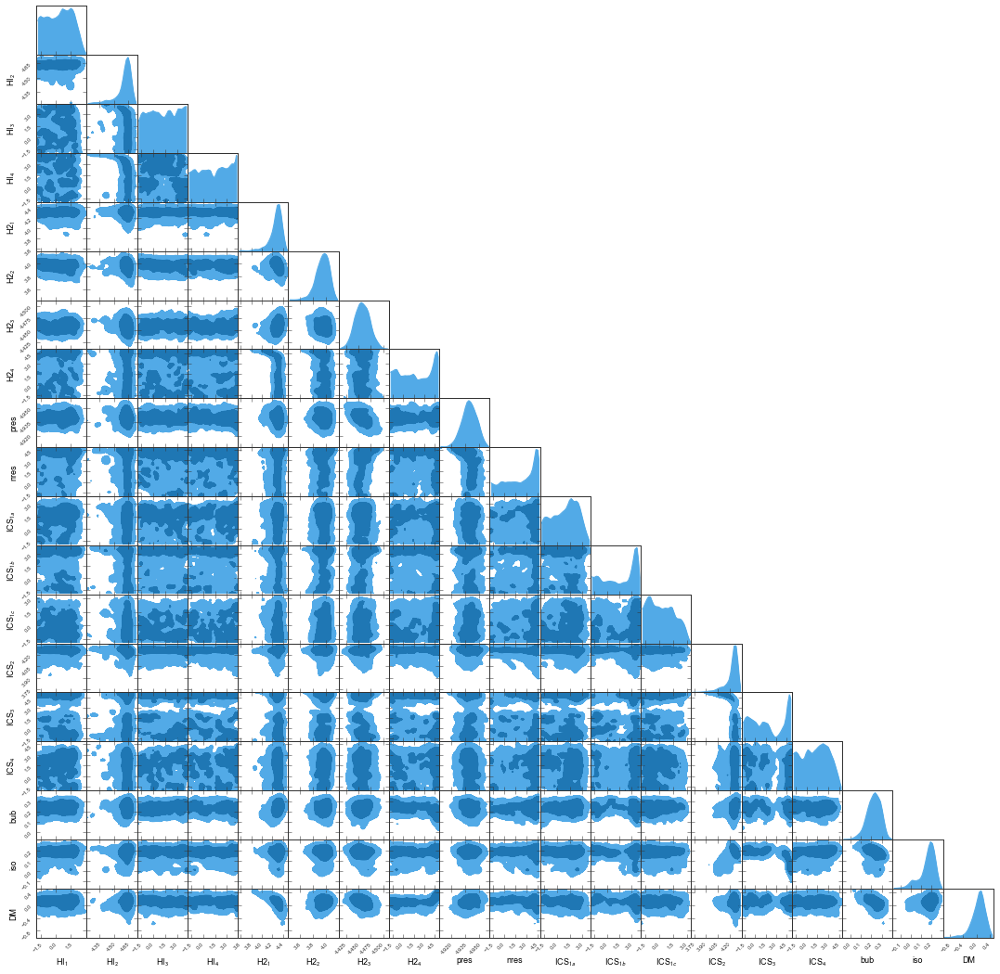

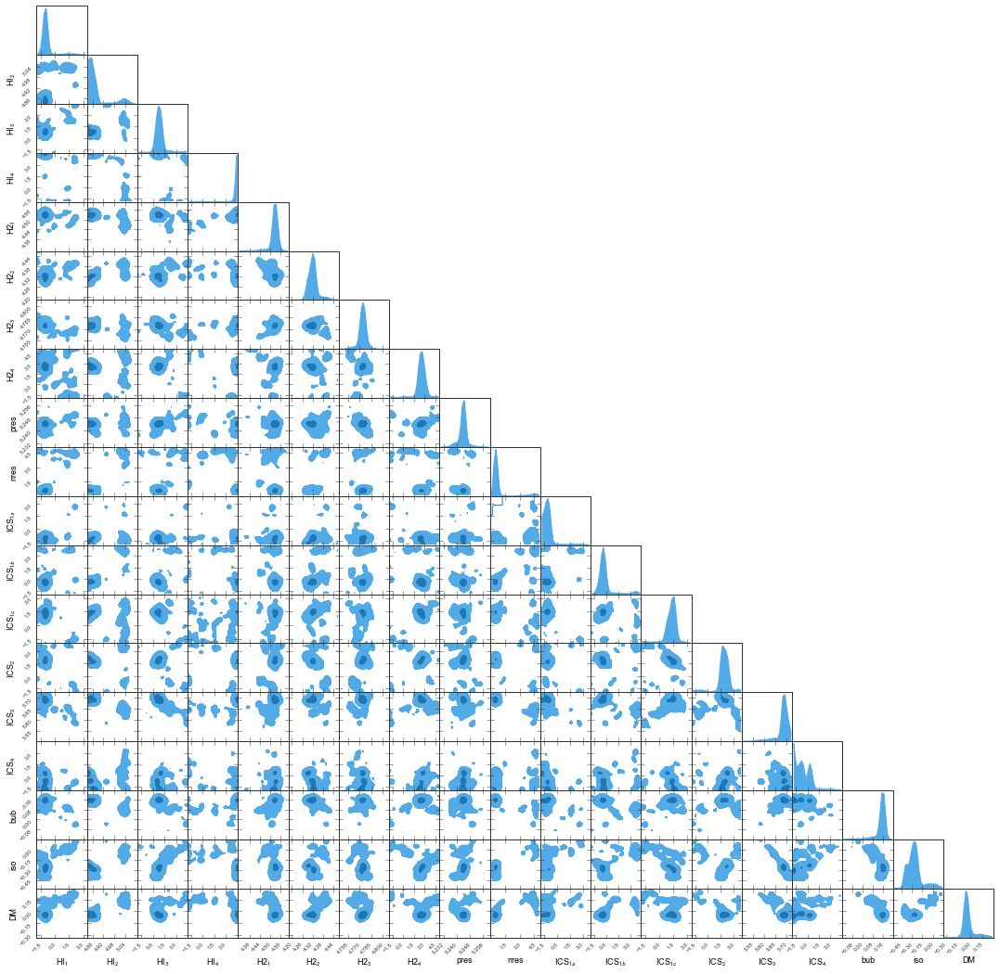

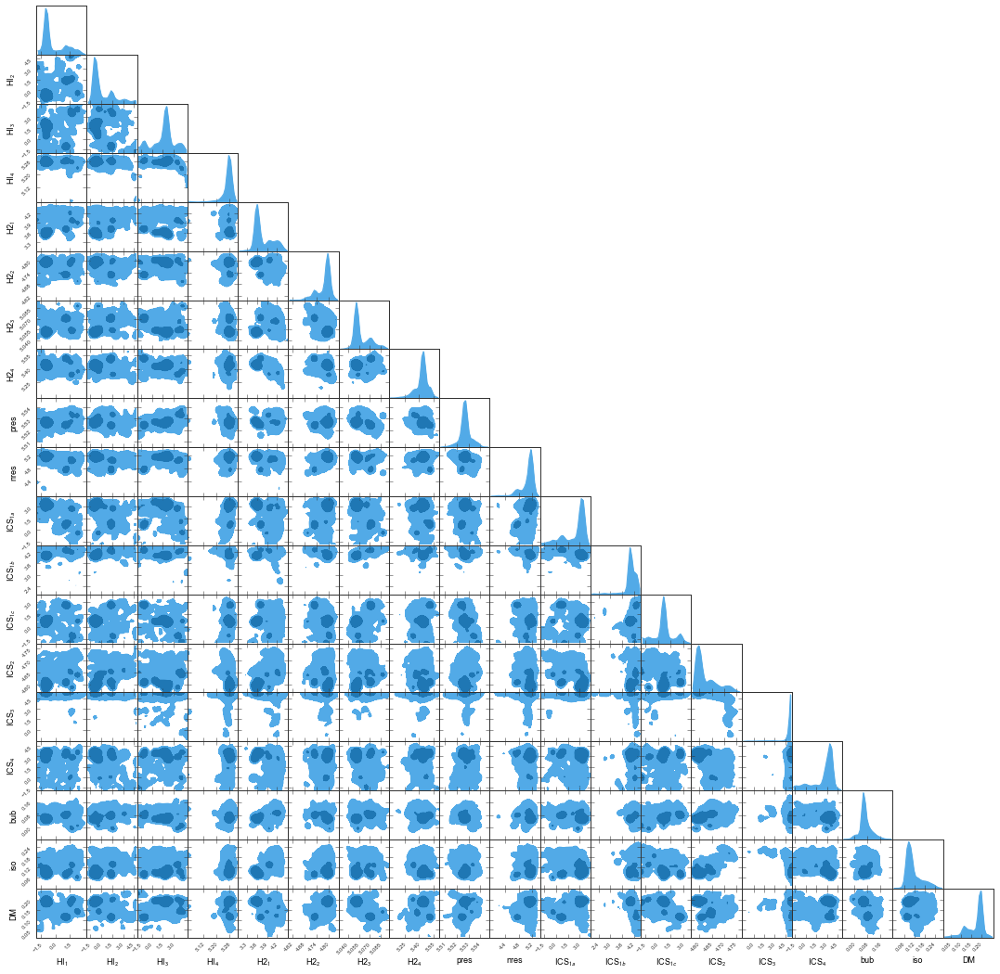

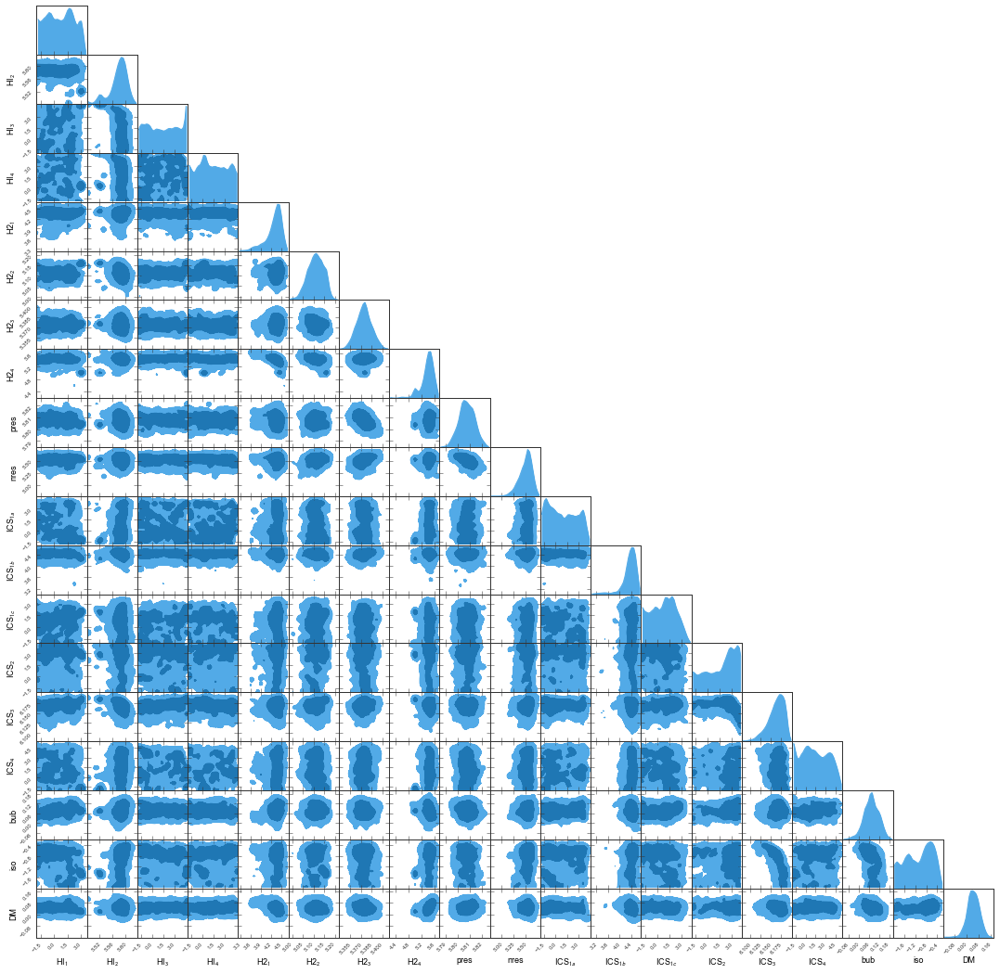

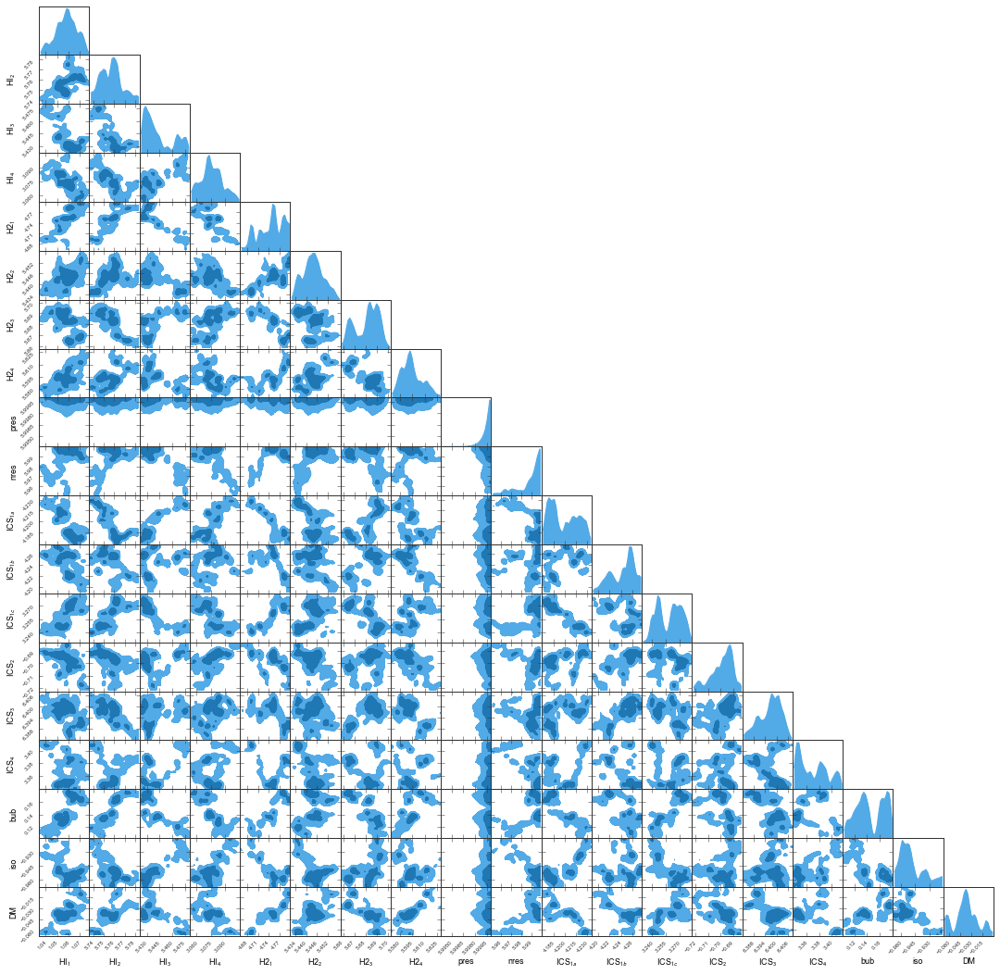

...

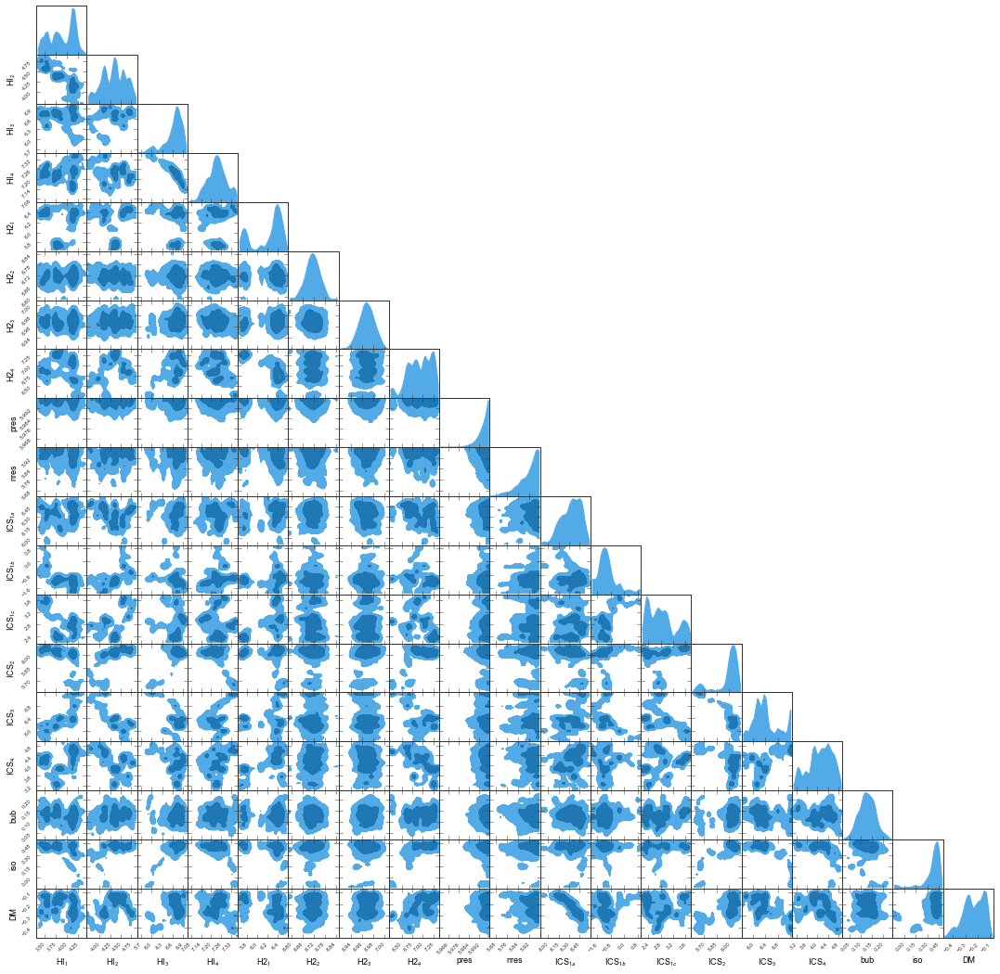

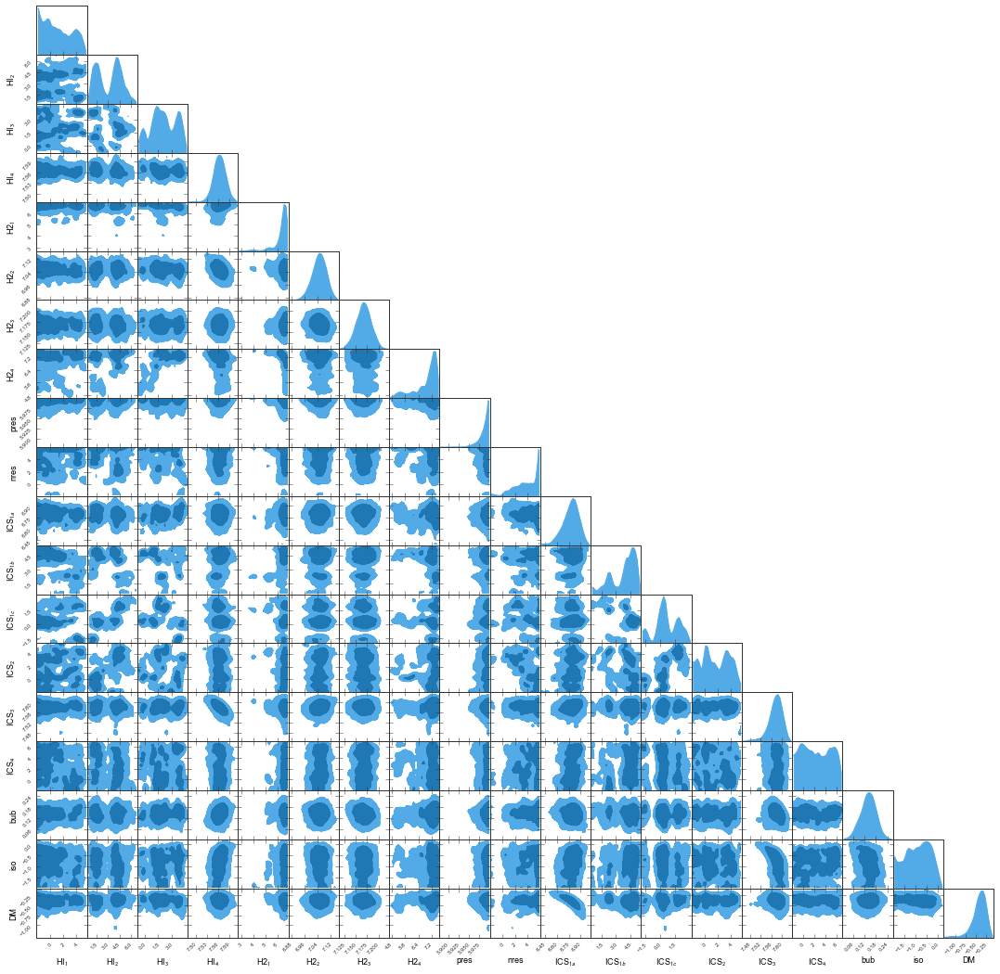

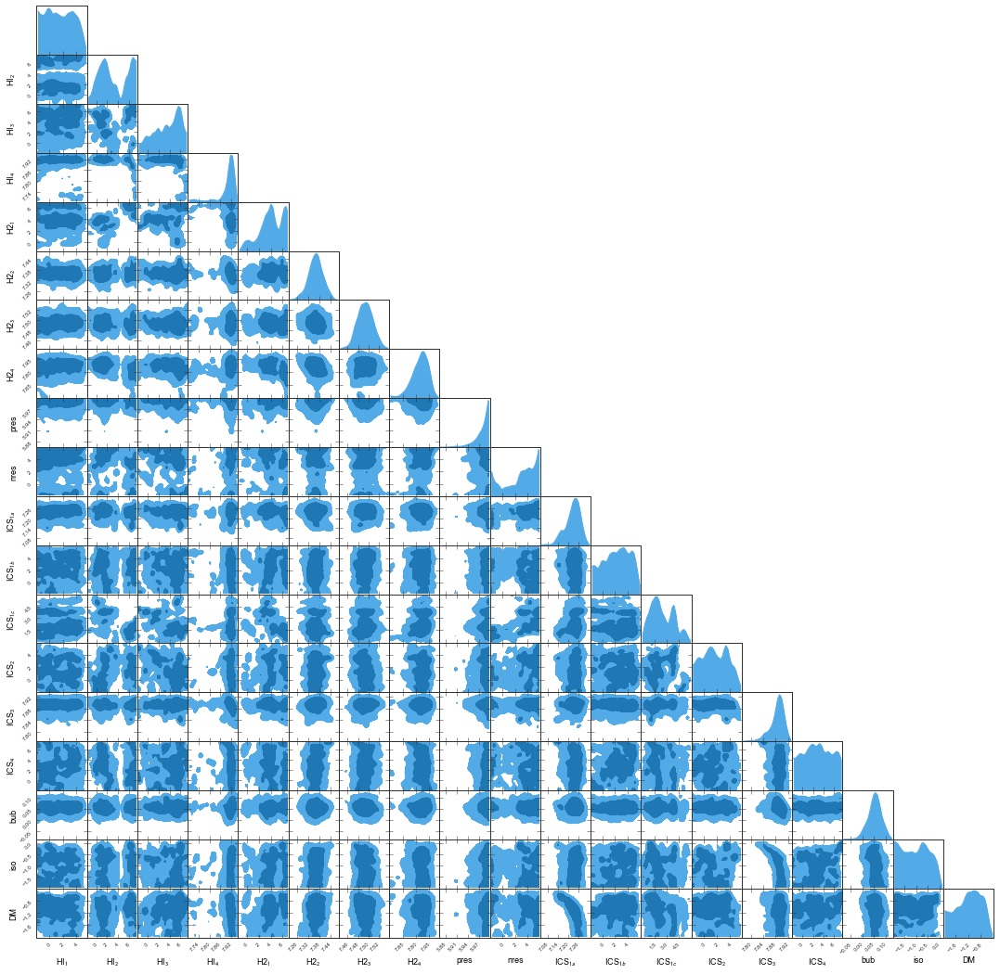

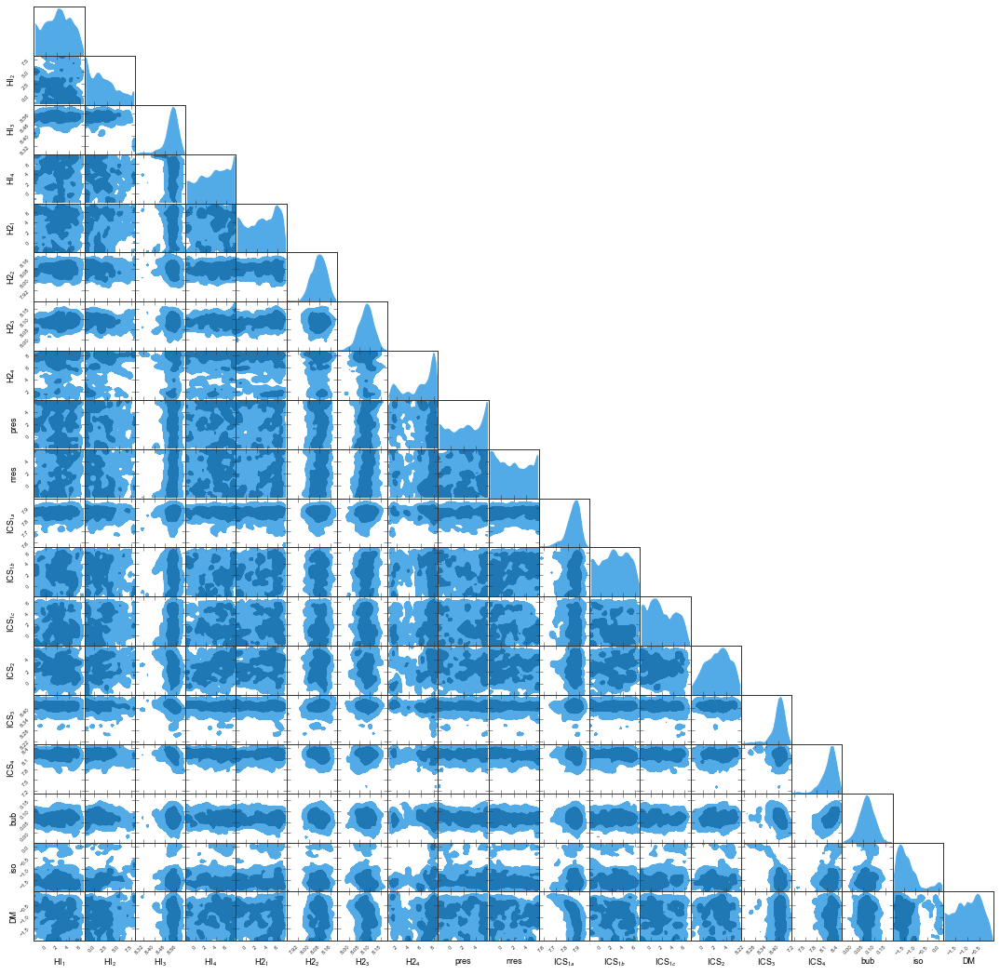

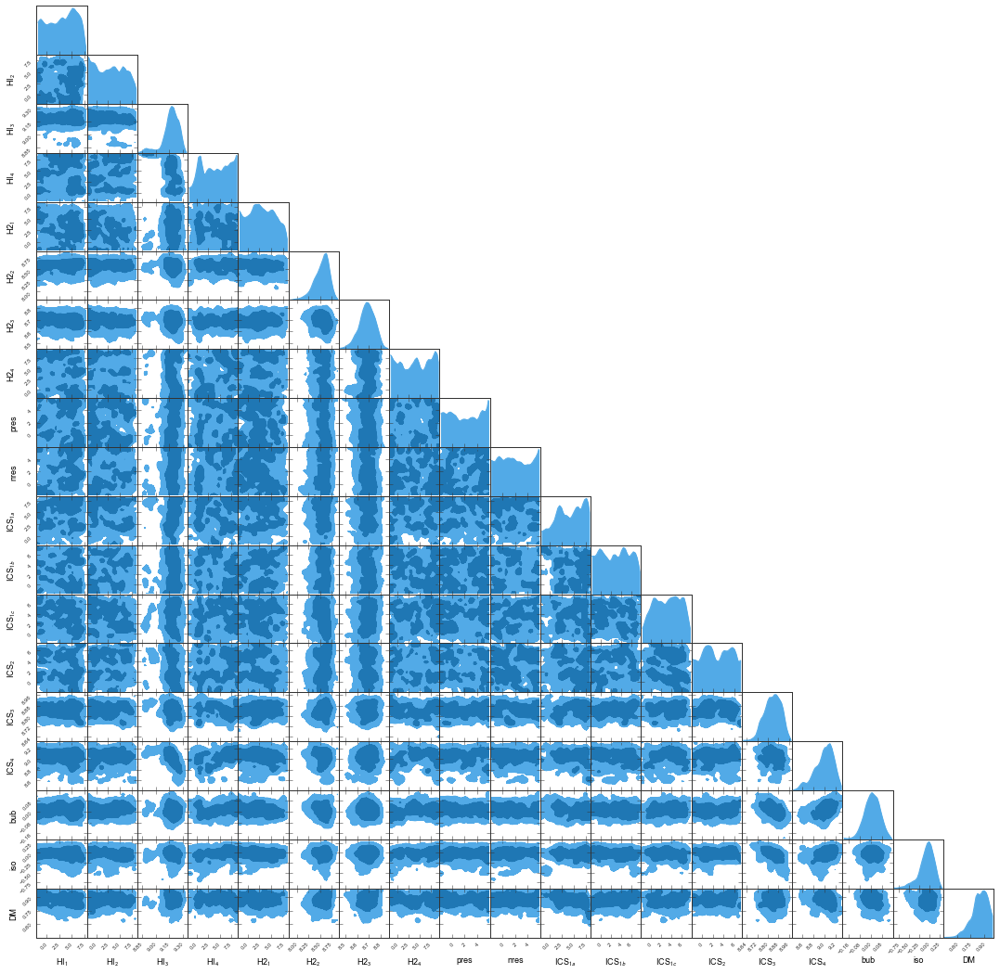

In [65]:
e_samp_dict['plot']={}
for i in range(14):
    e_samp_dict['plot'][i] = pygtc.plotGTC(chains=e_samp_dict['nr_sampler'][i].get_samples(), paramNames=names,
                                          plotName = 'cornerplots/testpygtc_e'+str(i)+'.pdf')

In [3]:
gce_5000samp_dict=zeros((14,19,3))

In [5]:
for i in range(14):
    gce_5000samp_dict[i] = loadtxt('../gce2022/sam-things/fit_vals/fit_vals_Ebin'+str(i)+'_hmcu_19_smallres_5000samples.txt')

In [17]:
sdm5000dm = gce_5000samp_dict[:,-1,:]

In [15]:
yzolddict = load("/Users/sammcd00/Dropbox/1recently-completed-papers/46wavelets4_cmsz/wavelets4_and_GCE_templates/YZ_template_fit_2021/fit_result_Macias/fit_Macias_19para.npy", allow_pickle=True)

In [12]:
yzbestdict = load("/Users/sammcd00/Dropbox/gce2022_loc/gce2022/YZ_template_fit_2022/fit_Macias_summary/2022-05-13_model_Macias_dm_1_mask_4FGLDR2.npy", allow_pickle=True)

In [77]:
yzbestdm = array([x['dm'] for x in yzbestdict])

In [79]:
sum([jjlnprob( yzbestvals[i], i ) for i in range(14)])

-1886209.1

In [19]:
yzolddm = array([x['dm'] for x in yzolddict])

In [95]:
yzgced = "/Users/sammcd00/Dropbox/1recently-completed-papers/46wavelets4_cmsz/wavelets4_and_GCE_templates/YZ_template_fit_2021/fit_summary_2021_October/dm_1/"
fgce = []
i=0
for k in os.listdir(yzgced):
    if ('4FGLDR2.npy' in k) and ('_nuclear_64' not in k):
        i+=1
        x0 = np.load(yzgced+k, allow_pickle=True)
        xm = re.split('model_', re.split('_dm_1', k)[0])[1]
        try:
            x2=array([x1['dm'] for x1 in x0], dtype=float)
            xl=array([x1['loglikelihood'] for x1 in x0], dtype=float)
            if sum(isnan(x2))>0:
                print('nanbot')
                pass
            else:
                fgce.append([sum(xl),xm,x2,xl])
        except Exception:
            print(i)
            pass

In [96]:
fgcel = array([y[0] for y in fgce])
as_lik = argsort(fgcel)[::-1]
fgcem = array([y[1] for y in fgce])[as_lik]
fgcen = array([y[2] for y in fgce])[as_lik]
fgcela = array([y[3] for y in fgce])[as_lik]
fgcel = sort(fgcel)[::-1]

In [97]:
mygcedat=fgcen[argsort(fgcel)[::-1]]#*list_E2_dif_flux

In [98]:
mygcells = sort(fgcel)[::-1]

In [99]:
fgcem

array(['8t', 'c4', 'ch', 'bf', '8l', '8f', '93', '9l', 'bs', '7n', 'bh',
       'ba', '9z', '23', 'ay', '7p', '7o', 'au', '0c', 'cv', 'd1', '0b',
       '71', '7t', 'cg', '0a', '7u', '1pB', '1qB', '1zB', '1yB', '1oB',
       '80', '7c', '2g', '70', '3j', '2y', '6n', '6z', '5s', '31', '2v',
       '67', '6e', '2s', '1rB', '2e', '2p', '2c', '1sB', '2r', '2u',
       '1nB', '2i', '1xB', '2w', '5q', '2t', '2z', '2q', '3z', '26', '30',
       '32', '1c', '0g', '22', '24', 'dy', '1d', '14', '1e', '0u', '0t',
       '1j', '1i', '0w', '0v', '1k'], dtype='<U3')

In [184]:
fgcel

array([-1875036.53364852, -1875044.93188648, -1875071.61082686,
       -1875111.32407718, -1875140.43390862, -1875151.52584474,
       -1875196.06048022, -1875220.35004968, -1875264.67772333,
       -1875271.8384848 , -1875274.42816752, -1875291.00289968,
       -1875366.49307529, -1875433.59171604, -1875457.57241999,
       -1875533.4393656 , -1875590.10221976, -1875620.94338622,
       -1875714.04056459, -1875731.34798362, -1875832.26998113,
       -1876063.84527691, -1876102.35410601, -1876142.65938563,
       -1876152.38928176, -1876163.42772153, -1876176.24685189,
       -1876178.6504072 , -1876281.91558169, -1876486.93509089,
       -1876504.41949021, -1876520.3070282 , -1876588.40849366,
       -1876698.18264209, -1876937.18723121, -1876961.80142841,
       -1877012.21626791, -1877014.34457621, -1877024.59940289,
       -1877028.10276161, -1877067.2347119 , -1877071.74624129,
       -1877072.01071967, -1877124.57466301, -1877126.25714358,
       -1877138.10510705, -1877157.11173

In [ ]:
load("/Users/sammcd00/Dropbox/1recently-completed-papers/46wavelets4_cmsz/wavelets4_and_GCE_templates/YZ_template_fit_2021/")

In [54]:
list_E2_dif_flux = array([ 2.74935e-07,  3.72289e-07,  4.84264e-07,  6.04804e-07,  7.24753e-07,  8.32594e-07,  9.15920e-07,  9.63451e-07,  9.67226e-07,  9.24449e-07,  8.38505e-07,  5.79152e-07,1.92644e-07,  2.41470e-08])
list_dif_flux= array([ 8.7793017e-07,9.1470452e-07, 9.1549138e-07, 8.7974823e-07, 8.1115740e-07, 7.1700084e-07, 6.0689728e-07, 4.9120064e-07, 3.7942720e-07,2.7903256e-07, 1.9473731e-07, 7.9630338e-08, 1.2065771e-08,6.8893354e-10])

In [260]:
log10(mygcedat[0][:,1])

array([-0.05478551, -0.06298399, -0.08975987, -0.13728366, -0.17770549,
       -0.02609702, -0.03283768, -0.0577846 , -0.1046373 , -0.07253258,
       -0.05999827, -0.11900362,  0.18482907,  0.85785426])

In [57]:
eb_dict[:,-1,:].T[1]

array([ 0.0831424 ,  0.14257514,  0.11089413,  0.02579034, -0.01580141,
        0.01709122, -0.04752892, -0.08126849, -0.31268711, -0.19832705,
       -0.4121647 , -1.1284391 , -1.0516626 ,  0.6258751 ])

In [49]:
ebin14 = array([313.162910358, 407.004243322, 528.965751061, 687.473829541, 893.47989989, 1161.21704886, 1509.18340158,
       1961.42016848, 2549.17266733, 3313.04908164, 4305.82610508, 7273.00221156, 15966.1266302, 35049.7899155])/1000

In [61]:
plt.rc('text', usetex=True)
plt.rc('font', size=16)

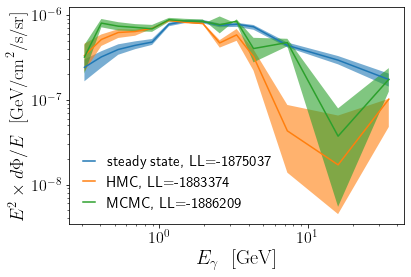

In [83]:
fill_between(ebin14, mygcedat[0][:,0]*list_E2_dif_flux, mygcedat[0][:,2]*list_E2_dif_flux, alpha=0.6)
fill_between(ebin14, 10**eb_dict[:,-1,:].T[0]*list_E2_dif_flux, 10**eb_dict[:,-1,:].T[2]*list_E2_dif_flux, alpha=0.6)
fill_between(ebin14, 10**array([x if x is not None else 0 for x in yzbestdm.T[0]])*list_E2_dif_flux,
             10**array([x if x is not None else -.2 for x in yzbestdm.T[2]])*list_E2_dif_flux, alpha=0.6)
plot(ebin14, mygcedat[0][:,1]*list_E2_dif_flux, label='steady state, LL={:.0f}'.format(mygcells[0]))
plot(ebin14, 10**eb_dict[:,-1,:].T[1]*list_E2_dif_flux, label='HMC, LL=-{:.0f}'.format(sum([e_samp_dict['nr_sampler'][i].last_state.potential_energy for i in range(14)])))
plot(ebin14, 10**yzbestdm.T[1]*list_E2_dif_flux, label='MCMC, LL={:.0f}'.format(sum([jjlnprob( yzbestvals[i], i ) for i in range(14)])))
yscale('log')
xscale('log')
# ylim(1e-9, 4e-6)
xlabel(r'$E_\gamma \ \ \textrm{[GeV]}$', fontsize=20)
ylabel(r'$E^2  \times d\Phi/E \ \ \textrm{[GeV/cm}^2\textrm{/s/sr]}$', fontsize=18)
legend(loc=3, fontsize=15, handlelength=.8, framealpha=0)
savefig("/Users/sammcd00/Desktop/dm-compare.pdf", bbox_inches='tight')
show()

In [134]:
llEhmc = array([-92943.30,-118176.77,-149452.48,-179944.91,-194466.92,-195265.94,-186598.16,-169023.41,-151561.25,
       -126221.69,-103763.02,-125639.69,-61942.41,-28358.35])

In [96]:
[-e_samp_dict['nr_sampler'][i].last_state.potential_energy for i in range(14)]

[DeviceArray(-92951.04, dtype=float32),
 DeviceArray(-118176.56, dtype=float32),
 DeviceArray(-149457.31, dtype=float32),
 DeviceArray(-179952.14, dtype=float32),
 DeviceArray(-194464.9, dtype=float32),
 DeviceArray(-195266.83, dtype=float32),
 DeviceArray(-186602.47, dtype=float32),
 DeviceArray(-169024.39, dtype=float32),
 DeviceArray(-151555.38, dtype=float32),
 DeviceArray(-126217.875, dtype=float32),
 DeviceArray(-103764.03, dtype=float32),
 DeviceArray(-125636.15, dtype=float32),
 DeviceArray(-61943.285, dtype=float32),
 DeviceArray(-28361.291, dtype=float32)]

In [135]:
llEmcmc = array([-93002.86,-119765.36,-149675.06,-180284.38,-194486.36,-195283.22,-186659.98,-169038.03,-151623.70,
       -126326.09,-103781.66,-125902.18,-61971.50,-28408.83])

In [136]:
sum(llEhmc), sum(llEmcmc)

(-1883358.2999999998, -1886209.21)

In [47]:
-2*fgcela[0]/array([sum(z) for z in mask_20x20])

array([4.11683044, 3.97805107, 3.82709799, 3.65339007, 3.42413302,
       3.16868688, 2.85468542, 2.50295586, 2.16205621, 1.79958302,
       1.46053335, 1.76435096, 0.86113431, 0.39479102])

In [50]:
array([sum(z) for z in mask_20x20]), sum(mask_20x20), sum(mask_20x20)/400/400/14

(array([ 45157.,  59368.,  78023.,  98369., 113345., 122544., 129602.,
        133951., 139154., 139410., 141412., 141629., 143468., 143509.]),
 1628941.0,
 0.7272058035714286)

In [79]:
def rtemplates_masked(bin_no):
    return array([smooth_HI_ring1_20x20[bin_no],
                    smooth_HI_ring2_20x20[bin_no], smooth_HI_ring3_20x20[bin_no], smooth_HI_ring4_20x20[bin_no],
                 smooth_H2_ring1_20x20[bin_no], smooth_H2_ring2_20x20[bin_no], smooth_H2_ring3_20x20[bin_no],
                    smooth_H2_ring4_20x20[bin_no], smooth_posres_20x20[bin_no],smooth_negres_20x20[bin_no],
                 smooth_ics_ring1A_20x20[bin_no], smooth_ics_ring1B_20x20[bin_no], smooth_ics_ring1C_20x20[bin_no],
                 smooth_ics_ring2_20x20[bin_no], smooth_ics_ring3_20x20[bin_no], smooth_ics_ring4_20x20[bin_no],
                 smooth_bubble_20x20[bin_no], smooth_isotropic_20x20[bin_no], smooth_dm_20x20[bin_no]])

/Users/sammcd00/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: FixedFormatter should only be used together with FixedLocator
  import sys
/Users/sammcd00/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: FixedFormatter should only be used together with FixedLocator
  


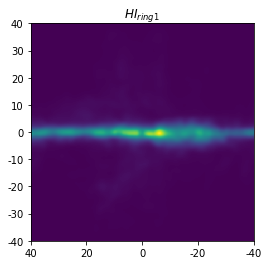

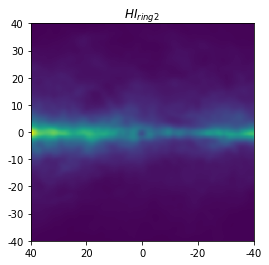

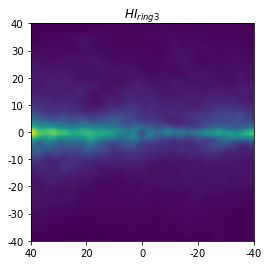

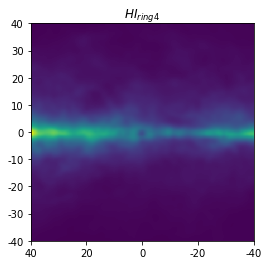

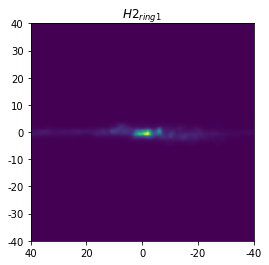

...

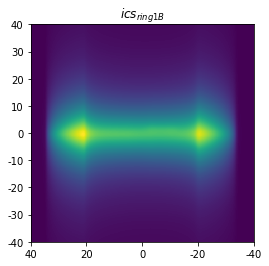

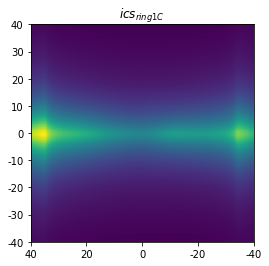

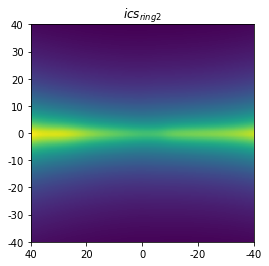

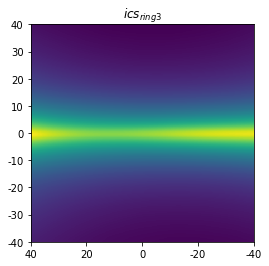

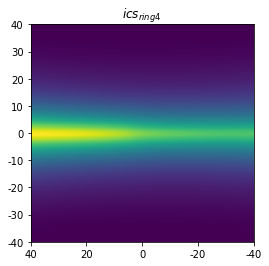

IndexError: list index out of range

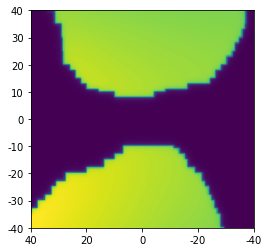

In [80]:
names =['HI_{ring1}','HI_{ring2}','HI_{ring3}','HI_{ring4}','H2_{ring1}','H2_{ring2}','H2_{ring3}','H2_{ring4}',\
'posres', 'negres',\
'ics_{ring1A}', 'ics_{ring1B}', 'ics_{ring1C}', 'ics_{ring2}', 'ics_{ring3}', 'ics_{ring4}']
for i in range(len(jtemplates_masked(8))):
    f, ax = subplots(figsize=(4,4))
    ax.pcolormesh(rtemplates_masked(8)[i].reshape(400,400)*(-1 if i==9 else 1))
    ax.set_xticklabels([40,20,0,-20,-40])
    ax.set_yticklabels([-40,-30,-20,-10,0,10,20,30,40])
#     estr = "$E_{"+str(i)+"}$"
    estr = '$'+names[i]+'$'
    ax.set_title(estr)
    savefig("./flux_plots_macias/e"+str(i)+".png", bbox_inches='tight')
    show()

In [77]:
jtemplates_masked(8)[9]

DeviceArray([-1.1930856e-09, -1.2479098e-09, -1.3468375e-09, ...,
             -2.0819819e-13, -2.0932618e-13, -2.1043147e-13],            dtype=float32)

In [81]:
import dynesty as dn

In [82]:
def ptform(x):
    return x*(pmax-pmin)+pmin

In [108]:
alt_e7_dn = dn.NestedSampler(lambda x: jjlnlike(x, 7), ptform, 19)

In [109]:
alt_e7_dn.run_nested()

24898it [21:31, 19.28it/s, +500 | bound: 313 | nc: 1 | ncall: 918918 | eff(%):  2.765 | loglstar:   -inf < -169002.844 <    inf | logz: -169052.063 +/-  0.616 | dlogz:  0.001 >  0.509]


Removed no burn in


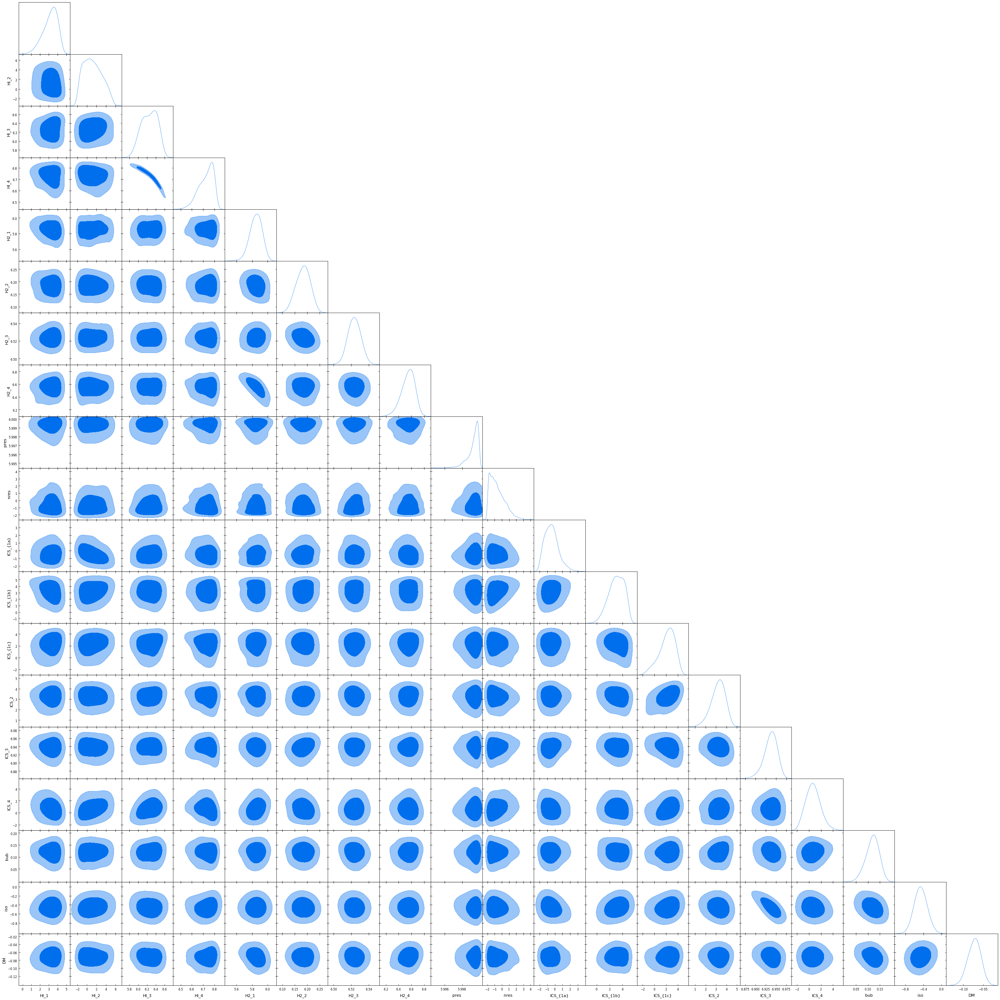

In [110]:
# gg={}
# e_mcs={}
names=['HI_1', 'HI_2', 'HI_3', 'HI_4', 'H2_1', 'H2_2', 'H2_3', 'H2_4', 'pres', 'nres', 'ICS_{1a}', 'ICS_{1b}',
       'ICS_{1c}', 'ICS_2', 'ICS_3', 'ICS_4', 'bub', 'iso', 'DM']
labels=[r'$\text{HI}_1$', r'$\text{HI}_2$', r'$\text{HI}_3$', r'$\text{HI}_4$', r'$\text{H2}_1$', r'$\text{H2}_2$',
        r'$\text{H2}_3$', r'$\text{H2}_4$', 'pres', 'nres', r'$\text{ICS}_{1a}$', r'$\text{ICS}_{1b}$',
       r'$\text{ICS}_{1c}$', r'$\text{ICS}_2$', r'$\text{ICS}_3$', r'$\text{ICS}_4$', 'bub', 'iso', 'DM']
# for i in range(14):
#     estr = 'e'+str(i)
#     print(estr)
ggalt=plots.get_subplot_plotter()
ggalt.triangle_plot(MCSamples(samples = alt_e7_dn.results.samples, weights=exp(alt_e7_dn.results.logz - alt_e7_dn.results.logz[-1])
                              , ranges=p_range, names=names), fine_bins_2D = 40, filled=True)
ggalt.export("cornerplots/alte7_dn.pdf")

In [107]:
import zeus

In [156]:
alt_e7_zs= zeus.EnsembleSampler(100, 19, lambda x: jjlnprob(x, 7))

In [169]:
alt_e7_zs.run_mcmc(jax.random.uniform(rng_key_, (100,19))*(pmax-pmin)+pmin, 3000)

Initialising ensemble of 100 walkers...




Sampling progress :   0%|                                                                                                                                                                                                                                               | 0/3000 [00:00<?, ?it/s]



Sampling progress :   0%|                                                                                                                                                                                                                                       | 1/3000 [00:00<46:02,  1.09it/s]



Sampling progress :   0%|▏                                                                                                                                                                                                                                    | 2/3000 [00:02<1:01:57,  1.24s/it]



Sampling progress :   0%|▏                                                   

Sampling progress :   2%|███▉                                                                                                                                                                                                                                  | 52/3000 [00:34<28:21,  1.73it/s]



Sampling progress :   2%|████                                                                                                                                                                                                                                  | 53/3000 [00:35<29:01,  1.69it/s]



Sampling progress :   2%|████▏                                                                                                                                                                                                                                 | 54/3000 [00:36<30:21,  1.62it/s]



Sampling progress :   2%|████▏                                                                                           

Sampling progress :   3%|███████▉                                                                                                                                                                                                                             | 104/3000 [01:08<32:38,  1.48it/s]



Sampling progress :   4%|████████                                                                                                                                                                                                                             | 105/3000 [01:08<31:52,  1.51it/s]



Sampling progress :   4%|████████                                                                                                                                                                                                                             | 106/3000 [01:09<31:57,  1.51it/s]



Sampling progress :   4%|████████▏                                                                                       

Sampling progress :   5%|███████████▉                                                                                                                                                                                                                         | 156/3000 [01:44<35:55,  1.32it/s]



Sampling progress :   5%|███████████▉                                                                                                                                                                                                                         | 157/3000 [01:45<35:08,  1.35it/s]



Sampling progress :   5%|████████████                                                                                                                                                                                                                         | 158/3000 [01:46<34:34,  1.37it/s]



Sampling progress :   5%|████████████▏                                                                                   

Sampling progress :   7%|███████████████▉                                                                                                                                                                                                                     | 208/3000 [02:24<37:05,  1.25it/s]



Sampling progress :   7%|███████████████▉                                                                                                                                                                                                                     | 209/3000 [02:25<39:02,  1.19it/s]



Sampling progress :   7%|████████████████                                                                                                                                                                                                                     | 210/3000 [02:26<38:40,  1.20it/s]



Sampling progress :   7%|████████████████                                                                                

Sampling progress :   9%|███████████████████▊                                                                                                                                                                                                                 | 260/3000 [03:07<36:25,  1.25it/s]



Sampling progress :   9%|███████████████████▉                                                                                                                                                                                                                 | 261/3000 [03:08<35:54,  1.27it/s]



Sampling progress :   9%|███████████████████▉                                                                                                                                                                                                                 | 262/3000 [03:09<35:19,  1.29it/s]



Sampling progress :   9%|████████████████████                                                                            

Sampling progress :  10%|███████████████████████▊                                                                                                                                                                                                             | 312/3000 [03:48<32:49,  1.36it/s]



Sampling progress :  10%|███████████████████████▉                                                                                                                                                                                                             | 313/3000 [03:48<33:24,  1.34it/s]



Sampling progress :  10%|███████████████████████▉                                                                                                                                                                                                             | 314/3000 [03:49<32:16,  1.39it/s]



Sampling progress :  10%|████████████████████████                                                                        

Sampling progress :  12%|███████████████████████████▊                                                                                                                                                                                                         | 364/3000 [04:29<35:04,  1.25it/s]



Sampling progress :  12%|███████████████████████████▊                                                                                                                                                                                                         | 365/3000 [04:30<35:09,  1.25it/s]



Sampling progress :  12%|███████████████████████████▉                                                                                                                                                                                                         | 366/3000 [04:30<35:14,  1.25it/s]



Sampling progress :  12%|████████████████████████████                                                                    

Sampling progress :  14%|███████████████████████████████▊                                                                                                                                                                                                     | 416/3000 [05:11<36:17,  1.19it/s]



Sampling progress :  14%|███████████████████████████████▊                                                                                                                                                                                                     | 417/3000 [05:12<34:47,  1.24it/s]



Sampling progress :  14%|███████████████████████████████▉                                                                                                                                                                                                     | 418/3000 [05:12<34:10,  1.26it/s]



Sampling progress :  14%|███████████████████████████████▉                                                                

Sampling progress :  16%|███████████████████████████████████▋                                                                                                                                                                                                 | 468/3000 [05:53<34:51,  1.21it/s]



Sampling progress :  16%|███████████████████████████████████▊                                                                                                                                                                                                 | 469/3000 [05:54<35:16,  1.20it/s]



Sampling progress :  16%|███████████████████████████████████▉                                                                                                                                                                                                 | 470/3000 [05:55<35:25,  1.19it/s]



Sampling progress :  16%|███████████████████████████████████▉                                                            

Sampling progress :  17%|███████████████████████████████████████▋                                                                                                                                                                                             | 520/3000 [06:38<33:48,  1.22it/s]



Sampling progress :  17%|███████████████████████████████████████▊                                                                                                                                                                                             | 521/3000 [06:39<33:46,  1.22it/s]



Sampling progress :  17%|███████████████████████████████████████▊                                                                                                                                                                                             | 522/3000 [06:40<37:26,  1.10it/s]



Sampling progress :  17%|███████████████████████████████████████▉                                                        

Sampling progress :  19%|███████████████████████████████████████████▋                                                                                                                                                                                         | 572/3000 [07:22<34:45,  1.16it/s]



Sampling progress :  19%|███████████████████████████████████████████▋                                                                                                                                                                                         | 573/3000 [07:23<34:22,  1.18it/s]



Sampling progress :  19%|███████████████████████████████████████████▊                                                                                                                                                                                         | 574/3000 [07:23<33:14,  1.22it/s]



Sampling progress :  19%|███████████████████████████████████████████▉                                                    

Sampling progress :  21%|███████████████████████████████████████████████▋                                                                                                                                                                                     | 624/3000 [08:04<32:03,  1.24it/s]



Sampling progress :  21%|███████████████████████████████████████████████▋                                                                                                                                                                                     | 625/3000 [08:05<31:52,  1.24it/s]



Sampling progress :  21%|███████████████████████████████████████████████▊                                                                                                                                                                                     | 626/3000 [08:06<32:13,  1.23it/s]



Sampling progress :  21%|███████████████████████████████████████████████▊                                                

Sampling progress :  23%|███████████████████████████████████████████████████▌                                                                                                                                                                                 | 676/3000 [08:56<42:07,  1.09s/it]



Sampling progress :  23%|███████████████████████████████████████████████████▋                                                                                                                                                                                 | 677/3000 [08:57<41:07,  1.06s/it]



Sampling progress :  23%|███████████████████████████████████████████████████▊                                                                                                                                                                                 | 678/3000 [08:58<39:06,  1.01s/it]



Sampling progress :  23%|███████████████████████████████████████████████████▊                                            

Sampling progress :  24%|███████████████████████████████████████████████████████▌                                                                                                                                                                             | 728/3000 [09:42<32:34,  1.16it/s]



Sampling progress :  24%|███████████████████████████████████████████████████████▋                                                                                                                                                                             | 729/3000 [09:43<32:19,  1.17it/s]



Sampling progress :  24%|███████████████████████████████████████████████████████▋                                                                                                                                                                             | 730/3000 [09:44<33:11,  1.14it/s]



Sampling progress :  24%|███████████████████████████████████████████████████████▊                                        

Sampling progress :  26%|███████████████████████████████████████████████████████████▌                                                                                                                                                                         | 780/3000 [10:29<30:10,  1.23it/s]



Sampling progress :  26%|███████████████████████████████████████████████████████████▌                                                                                                                                                                         | 781/3000 [10:30<30:19,  1.22it/s]



Sampling progress :  26%|███████████████████████████████████████████████████████████▋                                                                                                                                                                         | 782/3000 [10:30<30:22,  1.22it/s]



Sampling progress :  26%|███████████████████████████████████████████████████████████▊                                    

Sampling progress :  28%|███████████████████████████████████████████████████████████████▌                                                                                                                                                                     | 832/3000 [11:13<30:00,  1.20it/s]



Sampling progress :  28%|███████████████████████████████████████████████████████████████▌                                                                                                                                                                     | 833/3000 [11:14<29:48,  1.21it/s]



Sampling progress :  28%|███████████████████████████████████████████████████████████████▋                                                                                                                                                                     | 834/3000 [11:15<30:01,  1.20it/s]



Sampling progress :  28%|███████████████████████████████████████████████████████████████▋                                

Sampling progress :  29%|███████████████████████████████████████████████████████████████████▍                                                                                                                                                                 | 884/3000 [11:56<30:37,  1.15it/s]



Sampling progress :  30%|███████████████████████████████████████████████████████████████████▌                                                                                                                                                                 | 885/3000 [11:57<30:33,  1.15it/s]



Sampling progress :  30%|███████████████████████████████████████████████████████████████████▋                                                                                                                                                                 | 886/3000 [11:58<30:30,  1.15it/s]



Sampling progress :  30%|███████████████████████████████████████████████████████████████████▋                            

Sampling progress :  31%|███████████████████████████████████████████████████████████████████████▍                                                                                                                                                             | 936/3000 [12:40<32:04,  1.07it/s]



Sampling progress :  31%|███████████████████████████████████████████████████████████████████████▌                                                                                                                                                             | 937/3000 [12:41<31:48,  1.08it/s]



Sampling progress :  31%|███████████████████████████████████████████████████████████████████████▌                                                                                                                                                             | 938/3000 [12:42<30:55,  1.11it/s]



Sampling progress :  31%|███████████████████████████████████████████████████████████████████████▋                        

Sampling progress :  33%|███████████████████████████████████████████████████████████████████████████▍                                                                                                                                                         | 988/3000 [13:24<28:23,  1.18it/s]



Sampling progress :  33%|███████████████████████████████████████████████████████████████████████████▍                                                                                                                                                         | 989/3000 [13:25<28:28,  1.18it/s]



Sampling progress :  33%|███████████████████████████████████████████████████████████████████████████▌                                                                                                                                                         | 990/3000 [13:26<28:19,  1.18it/s]



Sampling progress :  33%|███████████████████████████████████████████████████████████████████████████▋                    

Sampling progress :  35%|███████████████████████████████████████████████████████████████████████████████                                                                                                                                                     | 1040/3000 [14:08<27:01,  1.21it/s]



Sampling progress :  35%|███████████████████████████████████████████████████████████████████████████████                                                                                                                                                     | 1041/3000 [14:08<26:44,  1.22it/s]



Sampling progress :  35%|███████████████████████████████████████████████████████████████████████████████▏                                                                                                                                                    | 1042/3000 [14:09<26:54,  1.21it/s]



Sampling progress :  35%|███████████████████████████████████████████████████████████████████████████████▎                

Sampling progress :  36%|██████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                                 | 1092/3000 [14:51<26:46,  1.19it/s]



Sampling progress :  36%|███████████████████████████████████████████████████████████████████████████████████                                                                                                                                                 | 1093/3000 [14:51<27:16,  1.17it/s]



Sampling progress :  36%|███████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                                | 1094/3000 [14:52<27:01,  1.18it/s]



Sampling progress :  36%|███████████████████████████████████████████████████████████████████████████████████▏            

Sampling progress :  38%|██████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                             | 1144/3000 [15:33<25:21,  1.22it/s]



Sampling progress :  38%|███████████████████████████████████████████████████████████████████████████████████████                                                                                                                                             | 1145/3000 [15:34<25:02,  1.23it/s]



Sampling progress :  38%|███████████████████████████████████████████████████████████████████████████████████████                                                                                                                                             | 1146/3000 [15:35<24:38,  1.25it/s]



Sampling progress :  38%|███████████████████████████████████████████████████████████████████████████████████████▏        

Sampling progress :  40%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                         | 1196/3000 [16:17<23:59,  1.25it/s]



Sampling progress :  40%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                         | 1197/3000 [16:18<24:04,  1.25it/s]



Sampling progress :  40%|███████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                         | 1198/3000 [16:19<23:28,  1.28it/s]



Sampling progress :  40%|███████████████████████████████████████████████████████████████████████████████████████████     

Sampling progress :  42%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                     | 1248/3000 [16:59<23:14,  1.26it/s]



Sampling progress :  42%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                     | 1249/3000 [17:00<23:13,  1.26it/s]



Sampling progress :  42%|███████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                     | 1250/3000 [17:00<23:09,  1.26it/s]



Sampling progress :  42%|███████████████████████████████████████████████████████████████████████████████████████████████ 

Sampling progress :  43%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                 | 1300/3000 [17:41<22:59,  1.23it/s]



Sampling progress :  43%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                 | 1301/3000 [17:42<22:40,  1.25it/s]



Sampling progress :  43%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                 | 1302/3000 [17:43<23:06,  1.22it/s]



Sampling progress :  43%|████████████████████████████████████████████████████████████████████████████████████████████████

Sampling progress :  45%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                             | 1352/3000 [18:23<22:07,  1.24it/s]



Sampling progress :  45%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                             | 1353/3000 [18:24<22:14,  1.23it/s]



Sampling progress :  45%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                             | 1354/3000 [18:25<21:43,  1.26it/s]



Sampling progress :  45%|████████████████████████████████████████████████████████████████████████████████████████████████

Sampling progress :  47%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                         | 1404/3000 [19:07<22:42,  1.17it/s]



Sampling progress :  47%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                         | 1405/3000 [19:08<22:19,  1.19it/s]



Sampling progress :  47%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                         | 1406/3000 [19:08<22:33,  1.18it/s]



Sampling progress :  47%|████████████████████████████████████████████████████████████████████████████████████████████████

Sampling progress :  49%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                     | 1456/3000 [19:51<21:35,  1.19it/s]



Sampling progress :  49%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                     | 1457/3000 [19:52<21:24,  1.20it/s]



Sampling progress :  49%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                     | 1458/3000 [19:53<21:00,  1.22it/s]



Sampling progress :  49%|████████████████████████████████████████████████████████████████████████████████████████████████

Sampling progress :  50%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                 | 1508/3000 [20:35<20:52,  1.19it/s]



Sampling progress :  50%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                 | 1509/3000 [20:36<20:52,  1.19it/s]



Sampling progress :  50%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                 | 1510/3000 [20:37<20:37,  1.20it/s]



Sampling progress :  50%|████████████████████████████████████████████████████████████████████████████████████████████████

Sampling progress :  52%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                             | 1560/3000 [21:20<19:40,  1.22it/s]



Sampling progress :  52%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                             | 1561/3000 [21:20<19:37,  1.22it/s]



Sampling progress :  52%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                             | 1562/3000 [21:21<19:40,  1.22it/s]



Sampling progress :  52%|████████████████████████████████████████████████████████████████████████████████████████████████

Sampling progress :  54%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                         | 1612/3000 [22:04<19:34,  1.18it/s]



Sampling progress :  54%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                         | 1613/3000 [22:05<19:32,  1.18it/s]



Sampling progress :  54%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                         | 1614/3000 [22:06<19:14,  1.20it/s]



Sampling progress :  54%|████████████████████████████████████████████████████████████████████████████████████████████████

Sampling progress :  55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 1664/3000 [22:49<17:42,  1.26it/s]



Sampling progress :  56%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 1665/3000 [22:50<17:29,  1.27it/s]



Sampling progress :  56%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 1666/3000 [22:50<17:51,  1.25it/s]



Sampling progress :  56%|████████████████████████████████████████████████████████████████████████████████████████████████

Sampling progress :  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                 | 1716/3000 [23:30<16:49,  1.27it/s]



Sampling progress :  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                 | 1717/3000 [23:31<17:07,  1.25it/s]



Sampling progress :  57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 1718/3000 [23:31<17:00,  1.26it/s]



Sampling progress :  57%|████████████████████████████████████████████████████████████████████████████████████████████████

Sampling progress :  59%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                             | 1768/3000 [24:11<16:30,  1.24it/s]



Sampling progress :  59%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 1769/3000 [24:12<16:18,  1.26it/s]



Sampling progress :  59%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                             | 1770/3000 [24:12<16:15,  1.26it/s]



Sampling progress :  59%|████████████████████████████████████████████████████████████████████████████████████████████████

Sampling progress :  61%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                         | 1820/3000 [24:52<15:35,  1.26it/s]



Sampling progress :  61%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                         | 1821/3000 [24:53<15:45,  1.25it/s]



Sampling progress :  61%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                         | 1822/3000 [24:54<15:31,  1.26it/s]



Sampling progress :  61%|████████████████████████████████████████████████████████████████████████████████████████████████

Sampling progress :  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                     | 1872/3000 [25:33<14:55,  1.26it/s]



Sampling progress :  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                     | 1873/3000 [25:34<14:52,  1.26it/s]



Sampling progress :  62%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                     | 1874/3000 [25:35<14:58,  1.25it/s]



Sampling progress :  62%|████████████████████████████████████████████████████████████████████████████████████████████████

Sampling progress :  64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                 | 1924/3000 [26:14<13:53,  1.29it/s]



Sampling progress :  64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                 | 1925/3000 [26:15<13:48,  1.30it/s]



Sampling progress :  64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                 | 1926/3000 [26:16<13:59,  1.28it/s]



Sampling progress :  64%|████████████████████████████████████████████████████████████████████████████████████████████████

Sampling progress :  66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                             | 1976/3000 [26:55<13:30,  1.26it/s]



Sampling progress :  66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                             | 1977/3000 [26:56<13:33,  1.26it/s]



Sampling progress :  66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                             | 1978/3000 [26:57<13:31,  1.26it/s]



Sampling progress :  66%|████████████████████████████████████████████████████████████████████████████████████████████████

Sampling progress :  68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                         | 2028/3000 [27:37<13:50,  1.17it/s]



Sampling progress :  68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                         | 2029/3000 [27:38<13:29,  1.20it/s]



Sampling progress :  68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                         | 2030/3000 [27:39<13:24,  1.20it/s]



Sampling progress :  68%|████████████████████████████████████████████████████████████████████████████████████████████████

Sampling progress :  69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                      | 2080/3000 [28:19<12:30,  1.23it/s]



Sampling progress :  69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                     | 2081/3000 [28:20<12:36,  1.22it/s]



Sampling progress :  69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                     | 2082/3000 [28:21<12:51,  1.19it/s]



Sampling progress :  69%|████████████████████████████████████████████████████████████████████████████████████████████████

Sampling progress :  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                  | 2132/3000 [29:01<11:03,  1.31it/s]



Sampling progress :  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                  | 2133/3000 [29:02<11:05,  1.30it/s]



Sampling progress :  71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                 | 2134/3000 [29:02<11:09,  1.29it/s]



Sampling progress :  71%|████████████████████████████████████████████████████████████████████████████████████████████████

Sampling progress :  73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                              | 2184/3000 [29:42<11:10,  1.22it/s]



Sampling progress :  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 2185/3000 [29:43<11:03,  1.23it/s]



Sampling progress :  73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                             | 2186/3000 [29:44<10:57,  1.24it/s]



Sampling progress :  73%|████████████████████████████████████████████████████████████████████████████████████████████████

Sampling progress :  75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                          | 2236/3000 [30:25<10:33,  1.21it/s]



Sampling progress :  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                          | 2237/3000 [30:26<10:25,  1.22it/s]



Sampling progress :  75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                          | 2238/3000 [30:27<10:32,  1.21it/s]



Sampling progress :  75%|████████████████████████████████████████████████████████████████████████████████████████████████

Sampling progress :  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 2288/3000 [31:08<09:44,  1.22it/s]



Sampling progress :  76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 2289/3000 [31:09<09:35,  1.24it/s]



Sampling progress :  76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                      | 2290/3000 [31:10<09:31,  1.24it/s]



Sampling progress :  76%|████████████████████████████████████████████████████████████████████████████████████████████████

Sampling progress :  78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 2340/3000 [31:50<08:52,  1.24it/s]



Sampling progress :  78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2341/3000 [31:51<08:54,  1.23it/s]



Sampling progress :  78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 2342/3000 [31:52<09:01,  1.22it/s]



Sampling progress :  78%|████████████████████████████████████████████████████████████████████████████████████████████████

Sampling progress :  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 2392/3000 [32:33<08:16,  1.22it/s]



Sampling progress :  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 2393/3000 [32:34<08:20,  1.21it/s]



Sampling progress :  80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 2394/3000 [32:35<08:23,  1.20it/s]



Sampling progress :  80%|████████████████████████████████████████████████████████████████████████████████████████████████

Sampling progress :  81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 2444/3000 [33:15<07:11,  1.29it/s]



Sampling progress :  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 2445/3000 [33:16<07:05,  1.31it/s]



Sampling progress :  82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 2446/3000 [33:16<07:03,  1.31it/s]



Sampling progress :  82%|████████████████████████████████████████████████████████████████████████████████████████████████

Sampling progress :  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 2496/3000 [36:45<23:18,  2.78s/it]



Sampling progress :  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 2497/3000 [36:48<23:45,  2.83s/it]



Sampling progress :  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 2498/3000 [36:52<24:20,  2.91s/it]



Sampling progress :  83%|████████████████████████████████████████████████████████████████████████████████████████████████

Sampling progress :  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 2549/3000 [44:59<06:02,  1.24it/s]



Sampling progress :  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 2550/3000 [44:59<05:55,  1.26it/s]



Sampling progress :  85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 2551/3000 [45:00<05:56,  1.26it/s]



Sampling progress :  85%|████████████████████████████████████████████████████████████████████████████████████████████████

Sampling progress :  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 2601/3000 [45:41<05:38,  1.18it/s]



Sampling progress :  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 2602/3000 [45:41<05:31,  1.20it/s]



Sampling progress :  87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 2603/3000 [45:42<05:34,  1.19it/s]



Sampling progress :  87%|████████████████████████████████████████████████████████████████████████████████████████████████

Sampling progress :  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 2653/3000 [46:24<04:57,  1.17it/s]



Sampling progress :  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 2654/3000 [46:25<05:00,  1.15it/s]



Sampling progress :  88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 2655/3000 [46:26<05:02,  1.14it/s]



Sampling progress :  89%|████████████████████████████████████████████████████████████████████████████████████████████████

Sampling progress :  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 2705/3000 [47:09<03:50,  1.28it/s]



Sampling progress :  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2706/3000 [47:10<03:54,  1.26it/s]



Sampling progress :  90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 2707/3000 [47:11<03:53,  1.26it/s]



Sampling progress :  90%|████████████████████████████████████████████████████████████████████████████████████████████████

Sampling progress :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 2757/3000 [47:50<03:06,  1.31it/s]



Sampling progress :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 2758/3000 [47:51<03:04,  1.31it/s]



Sampling progress :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 2759/3000 [47:52<03:08,  1.28it/s]



Sampling progress :  92%|████████████████████████████████████████████████████████████████████████████████████████████████

Sampling progress :  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 2809/3000 [48:30<02:27,  1.30it/s]



Sampling progress :  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 2810/3000 [48:31<02:28,  1.28it/s]



Sampling progress :  94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 2811/3000 [48:32<02:29,  1.27it/s]



Sampling progress :  94%|████████████████████████████████████████████████████████████████████████████████████████████████

Sampling progress :  95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 2861/3000 [49:10<01:44,  1.33it/s]



Sampling progress :  95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 2862/3000 [49:11<01:44,  1.31it/s]



Sampling progress :  95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 2863/3000 [49:12<01:42,  1.33it/s]



Sampling progress :  95%|████████████████████████████████████████████████████████████████████████████████████████████████

Sampling progress :  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 2913/3000 [49:51<01:07,  1.29it/s]



Sampling progress :  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 2914/3000 [49:52<01:07,  1.27it/s]



Sampling progress :  97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 2915/3000 [49:52<01:05,  1.29it/s]



Sampling progress :  97%|████████████████████████████████████████████████████████████████████████████████████████████████

Sampling progress :  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 2965/3000 [50:31<00:26,  1.32it/s]



Sampling progress :  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 2966/3000 [50:32<00:25,  1.33it/s]



Sampling progress :  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 2967/3000 [50:33<00:25,  1.30it/s]



Sampling progress :  99%|████████████████████████████████████████████████████████████████████████████████████████████████

In [213]:
mean(alt_e7_zs.samples.logprob, axis=1).shape, alt_e7_dn.results.logz[-1]

((3000,), -169052.05874725233)

Removed no burn in


auto bandwidth for HI_1 very small or failed (h=0.0010752941637725126,N_eff=3899.057706838634). Using fallback (h=0.030098777229465613)
auto bandwidth for HI_2 very small or failed (h=0.0007030142612329113,N_eff=3899.057706838634). Using fallback (h=0.03875753831247548)
auto bandwidth for HI_3 very small or failed (h=0.0005361533039493538,N_eff=3899.057706838634). Using fallback (h=0.0418655046975901)
auto bandwidth for HI_4 very small or failed (h=0.000432098242175949,N_eff=3899.057706838634). Using fallback (h=0.04528720032785299)
auto bandwidth for H2_1 very small or failed (h=0.0010637243361289704,N_eff=3899.057706838634). Using fallback (h=0.028033796092752368)
auto bandwidth for H2_2 very small or failed (h=0.0007648931166515809,N_eff=3899.057706838634). Using fallback (h=0.01469047274922734)
auto bandwidth for H2_3 very small or failed (h=0.0003998670732237507,N_eff=3899.057706838634). Using fallback (h=0.040876760075973774)
auto bandwidth for H2_4 very small or failed (h=0.0011

fine_bins_2D not large enough for optimal density
fine_bins_2D not large enough for optimal density
fine_bins_2D not large enough for optimal density
fine_bins_2D not large enough for optimal density
fine_bins_2D not large enough for optimal density
fine_bins_2D not large enough for optimal density
fine_bins_2D not large enough for optimal density
fine_bins_2D not large enough for optimal density
fine_bins_2D not large enough for optimal density
fine_bins_2D not large enough for optimal density
fine_bins_2D not large enough for optimal density
fine_bins_2D not large enough for optimal density
fine_bins_2D not large enough for optimal density
fine_bins_2D not large enough for optimal density
fine_bins_2D not large enough for optimal density
fine_bins_2D not large enough for optimal density
fine_bins_2D not large enough for optimal density
fine_bins_2D not large enough for optimal density
fine_bins_2D not large enough for optimal density
fine_bins_2D not large enough for optimal density


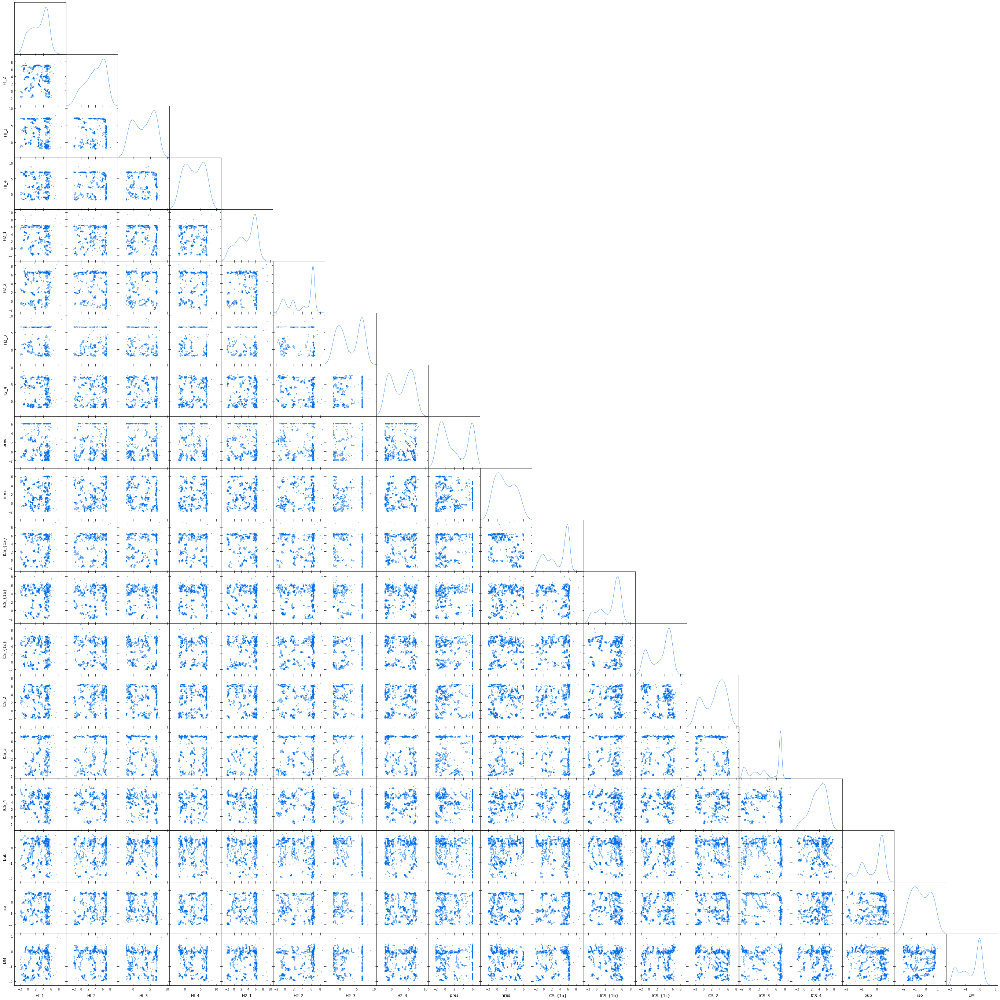

In [222]:
# gg={}
# e_mcs={}
names=['HI_1', 'HI_2', 'HI_3', 'HI_4', 'H2_1', 'H2_2', 'H2_3', 'H2_4', 'pres', 'nres', 'ICS_{1a}', 'ICS_{1b}',
       'ICS_{1c}', 'ICS_2', 'ICS_3', 'ICS_4', 'bub', 'iso', 'DM']
labels=[r'$\text{HI}_1$', r'$\text{HI}_2$', r'$\text{HI}_3$', r'$\text{HI}_4$', r'$\text{H2}_1$', r'$\text{H2}_2$',
        r'$\text{H2}_3$', r'$\text{H2}_4$', 'pres', 'nres', r'$\text{ICS}_{1a}$', r'$\text{ICS}_{1b}$',
       r'$\text{ICS}_{1c}$', r'$\text{ICS}_2$', r'$\text{ICS}_3$', r'$\text{ICS}_4$', 'bub', 'iso', 'DM']
# for i in range(14):
#     estr = 'e'+str(i)
#     print(estr)
ggalt=plots.get_subplot_plotter()
ggalt.triangle_plot(MCSamples(samples = alt_e7_zs.samples.flatten(), weights=exp(alt_e7_zs.samples.logprob - alt_e7_zs.samples.logprob[-1]).flatten(),
                              ranges=p_range, names=names), fine_bins_2D = 40, filled=True)
ggalt.export("cornerplots/alte7_zs.pdf")

In [226]:
max(alt_e7_zs.samples.logprob[-1]), alt_e7_dn.results.logz[-1], -float(e_samp_dict['nr_sampler'][7].last_state.potential_energy)

(-169099.3125, -169052.05874725233, -169021.75)

In [357]:
from jaxns import NestedSampler, save_results
from jaxns.prior_transforms import PriorChain, MVNPrior
from jaxns import summary, marginalise_dynamic
from jaxns import plot_cornerplot, plot_diagnostics

In [358]:
import jaxns